In [1]:
import os
import sys
#sys.path.append('/home/cjw/Code/DeepLearning')

import tensorflow as tf
import numpy as np
import pandas as pd

from autoencoder import autoencoder_train
from autoencoder import network
from autoencoder import utils

/home/cjw/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
#datadir = "/v/Data/cyto/ChannelOne/"
datadir = "/media/cjw/Data/cyto/Snail_rop/"

mmfiles = utils.list_mmfiles(datadir)
print(mmfiles)

mmdict = dict()

n_all_images = 0
for mmfilename in mmfiles:
#mmfilename = datadir + "Fish6_15_cjw_mean_zero.mm"
#mmfilename = datadir + "mmplate15-1.mm"
    mmheader = np.memmap(mmfilename, dtype="int32", mode='r',
                    shape=(4,))

    header_shape = mmheader.shape
    print(header_shape, mmheader)
    xshape = [mmheader[0], mmheader[1], mmheader[2], mmheader[3]]
    xshape = tuple(xshape)
    del mmheader
    n_all_images += xshape[0]
    
    m3 = np.memmap(mmfilename, dtype='float32', offset=128,
              mode='r', shape=xshape)
    key = mmfilename.split("/")[-1]
    mmdict[key] = m3

print(n_all_images)
mmdict.keys()

['/media/cjw/Data/cyto/Snail_rop/Snail4_NoBact.mm', '/media/cjw/Data/cyto/Snail_rop/Snail5_NoBact.mm', '/media/cjw/Data/cyto/Snail_rop/Snail3_NoBact.mm', '/media/cjw/Data/cyto/Snail_rop/Snail1_NoBact.mm', '/media/cjw/Data/cyto/Snail_rop/Snail2_NoBact.mm']
(4,) [6840   64   64    5]
(4,) [4649   64   64    5]
(4,) [7729   64   64    5]
(4,) [7854   64   64    5]
(4,) [8397   64   64    5]
35469


dict_keys(['Snail4_NoBact.mm', 'Snail5_NoBact.mm', 'Snail3_NoBact.mm', 'Snail1_NoBact.mm', 'Snail2_NoBact.mm'])

In [3]:
n = xshape[0]
all_ids =  range(n_all_images)
idx = 0
dataframes = list()
for key in mmdict.keys():
    mm = mmdict[key]
    n = mm.shape[0]
    print(n)
    file = n*[key[0:-3]]
    fid = range(n)
    mmfile = n*[key]
    plate = n*[0]
    row = n*[0]
    column = n*[0]
    field = n*[0]
    yc = n*[32]
    xc = n*[32]
    well = n*[0]
    ids = all_ids[idx:idx + n]
    idx += n
    df = pd.DataFrame({'id':ids, 'fid':fid, 'file':file, 'mmfile':mmfile, 'plate':plate,
                     'row':row, 'column':column, 'field':field,
                      'yc':yc, 'xc':xc, 'well':well})

    dataframes.append(df)
    
p_df = pd.concat(dataframes, ignore_index=True)

6840
4649
7729
7854
8397


Encoder True
Tensor("Placeholder:0", shape=(?, 32, 32, 3), dtype=float32) (?, 32, 32, 3)
Tensor("latent_space/BiasAdd:0", shape=(?, 256), dtype=float32)
isize:  4 32
Tensor("Tanh:0", shape=(?, 32, 32, 3), dtype=float32)
35469 277 128
34957 512
Iteration:  0 Loss:  65.95205 65.95205 0.0
Test Loss 67.817276
Iteration:  0 Loss:  65.95205 65.95205 0.0
Test Loss 67.817276


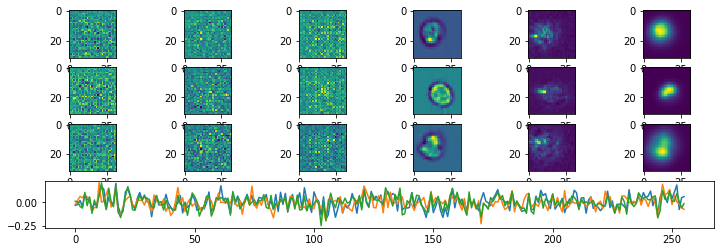

Iteration:  100 Loss:  20.77939 20.77939 0.0
Test Loss 20.674095
Iteration:  200 Loss:  14.644346 14.644346 0.0
Test Loss 15.894255
Iteration:  300 Loss:  13.527815 13.527815 0.0
Test Loss 13.244299
Iteration:  400 Loss:  11.414469 11.414469 0.0
Test Loss 11.866869
Iteration:  500 Loss:  10.29035 10.29035 0.0
Test Loss 10.892223
Iteration:  600 Loss:  9.60009 9.60009 0.0
Test Loss 10.071005
Iteration:  700 Loss:  8.661673 8.661673 0.0
Test Loss 9.658651
Iteration:  800 Loss:  8.370349 8.370349 0.0
Test Loss 9.146744
Iteration:  900 Loss:  8.181579 8.181579 0.0
Test Loss 8.752233
Iteration:  1000 Loss:  8.043617 8.043617 0.0
Test Loss 8.317423
Iteration:  1000 Loss:  8.043617 8.043617 0.0
Test Loss 8.317423


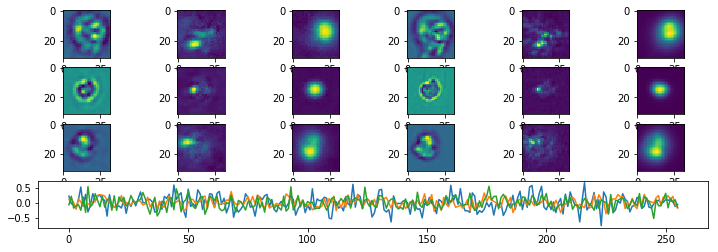

Iteration:  1100 Loss:  7.460208 7.460208 0.0
Test Loss 7.9933023
Iteration:  1200 Loss:  7.6172514 7.6172514 0.0
Test Loss 7.8113446
Iteration:  1300 Loss:  6.8016515 6.8016515 0.0
Test Loss 7.473992
Iteration:  1400 Loss:  7.0624037 7.0624037 0.0
Test Loss 7.261404
Iteration:  1500 Loss:  6.5345097 6.5345097 0.0
Test Loss 7.2336874
Iteration:  1600 Loss:  6.8355694 6.8355694 0.0
Test Loss 6.873967
Iteration:  1700 Loss:  5.9678483 5.9678483 0.0
Test Loss 6.7882366
Iteration:  1800 Loss:  6.2934203 6.2934203 0.0
Test Loss 6.5555863
Iteration:  1900 Loss:  5.904623 5.904623 0.0
Test Loss 6.4721932
Iteration:  2000 Loss:  5.617595 5.617595 0.0
Test Loss 6.320587
Iteration:  2000 Loss:  5.617595 5.617595 0.0
Test Loss 6.320587


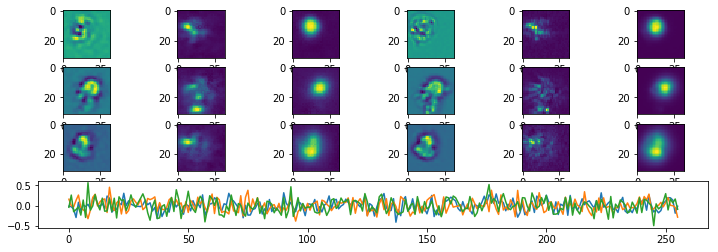

Iteration:  2100 Loss:  5.1851225 5.1851225 0.0
Test Loss 6.1799526
Iteration:  2200 Loss:  5.521278 5.521278 0.0
Test Loss 6.031465
Iteration:  2300 Loss:  5.7034082 5.7034082 0.0
Test Loss 5.972574
Iteration:  2400 Loss:  5.726701 5.726701 0.0
Test Loss 5.848568
Iteration:  2500 Loss:  5.485079 5.485079 0.0
Test Loss 5.743311
Iteration:  2600 Loss:  5.313827 5.313827 0.0
Test Loss 5.6771374
Iteration:  2700 Loss:  4.9382706 4.9382706 0.0
Test Loss 5.5599756
Iteration:  2800 Loss:  4.9829674 4.9829674 0.0
Test Loss 5.5813527
Iteration:  2900 Loss:  5.008568 5.008568 0.0
Test Loss 5.4115257
Iteration:  3000 Loss:  4.6262197 4.6262197 0.0
Test Loss 5.3340807
Iteration:  3000 Loss:  4.6262197 4.6262197 0.0
Test Loss 5.3340807


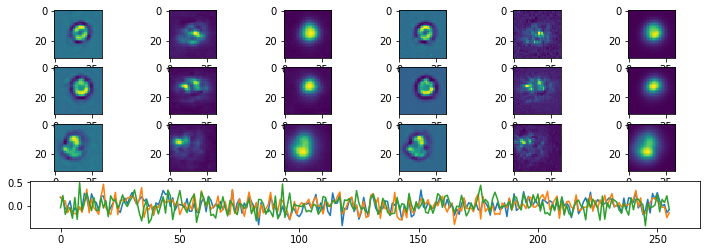

Iteration:  3100 Loss:  4.842965 4.842965 0.0
Test Loss 5.300041
Iteration:  3200 Loss:  4.4046082 4.4046082 0.0
Test Loss 5.2106147
Iteration:  3300 Loss:  4.5545187 4.5545187 0.0
Test Loss 5.1487484
Iteration:  3400 Loss:  4.529269 4.529269 0.0
Test Loss 5.0592055
Iteration:  3500 Loss:  4.567896 4.567896 0.0
Test Loss 5.052448
Iteration:  3600 Loss:  4.6603703 4.6603703 0.0
Test Loss 4.9738274
Iteration:  3700 Loss:  4.7352233 4.7352233 0.0
Test Loss 4.9853992
Iteration:  3800 Loss:  4.424686 4.424686 0.0
Test Loss 4.873434
Iteration:  3900 Loss:  4.351323 4.351323 0.0
Test Loss 4.820576
Iteration:  4000 Loss:  4.3877726 4.3877726 0.0
Test Loss 4.837902
Iteration:  4000 Loss:  4.3877726 4.3877726 0.0
Test Loss 4.837902


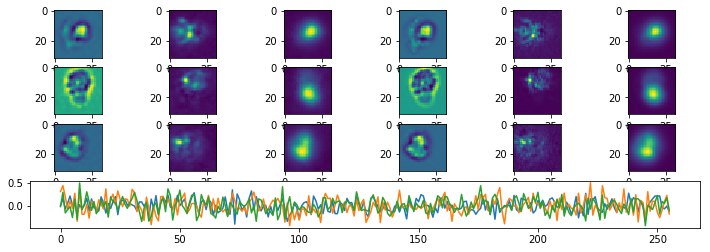

Iteration:  4100 Loss:  4.1308928 4.1308928 0.0
Test Loss 4.750382
Iteration:  4200 Loss:  4.4409466 4.4409466 0.0
Test Loss 4.7905602
Iteration:  4300 Loss:  4.072877 4.072877 0.0
Test Loss 4.654975
Iteration:  4400 Loss:  4.56746 4.56746 0.0
Test Loss 4.6167655
Iteration:  4500 Loss:  3.9816701 3.9816701 0.0
Test Loss 4.586209
Iteration:  4600 Loss:  3.8239672 3.8239672 0.0
Test Loss 4.560201
Iteration:  4700 Loss:  3.8722422 3.8722422 0.0
Test Loss 4.529055
Iteration:  4800 Loss:  4.0831847 4.0831847 0.0
Test Loss 4.4855676
Iteration:  4900 Loss:  4.1762724 4.1762724 0.0
Test Loss 4.4591885
Iteration:  5000 Loss:  3.8641677 3.8641677 0.0
Test Loss 4.406878
Iteration:  5000 Loss:  3.8641677 3.8641677 0.0
Test Loss 4.406878


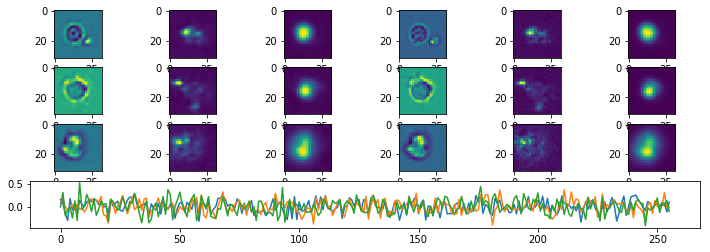

Iteration:  5100 Loss:  4.093082 4.093082 0.0
Test Loss 4.392621
Iteration:  5200 Loss:  3.7742007 3.7742007 0.0
Test Loss 4.3699164
Iteration:  5300 Loss:  3.9723728 3.9723728 0.0
Test Loss 4.371
Iteration:  5400 Loss:  3.9269564 3.9269564 0.0
Test Loss 4.3116093
Iteration:  5500 Loss:  3.6486976 3.6486976 0.0
Test Loss 4.3094063
Iteration:  5600 Loss:  3.4520805 3.4520805 0.0
Test Loss 4.236203
Iteration:  5700 Loss:  3.669377 3.669377 0.0
Test Loss 4.1979556
Iteration:  5800 Loss:  4.041604 4.041604 0.0
Test Loss 4.2521987
Iteration:  5900 Loss:  3.6720219 3.6720219 0.0
Test Loss 4.258881
Iteration:  6000 Loss:  3.4348674 3.4348674 0.0
Test Loss 4.1423855
Iteration:  6000 Loss:  3.4348674 3.4348674 0.0
Test Loss 4.1423855


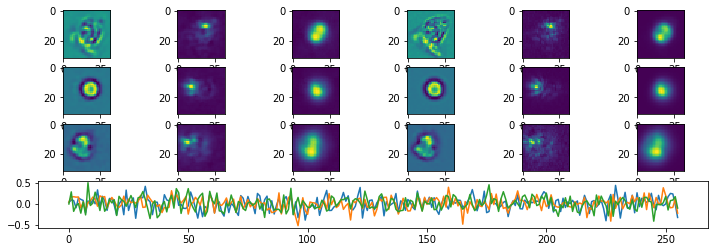

Iteration:  6100 Loss:  3.622292 3.622292 0.0
Test Loss 4.1457367
Iteration:  6200 Loss:  3.7950711 3.7950711 0.0
Test Loss 4.095304
Iteration:  6300 Loss:  3.7333682 3.7333682 0.0
Test Loss 4.065824
Iteration:  6400 Loss:  3.6472585 3.6472585 0.0
Test Loss 4.094681
Iteration:  6500 Loss:  3.5644722 3.5644722 0.0
Test Loss 4.0356116
Iteration:  6600 Loss:  3.5312824 3.5312824 0.0
Test Loss 4.0153832
Iteration:  6700 Loss:  3.4612741 3.4612741 0.0
Test Loss 3.9855742
Iteration:  6800 Loss:  3.6592522 3.6592522 0.0
Test Loss 4.0495853
Iteration:  6900 Loss:  3.319087 3.319087 0.0
Test Loss 3.9524996
Iteration:  7000 Loss:  3.4198964 3.4198964 0.0
Test Loss 3.9371548
Iteration:  7000 Loss:  3.4198964 3.4198964 0.0
Test Loss 3.9371548


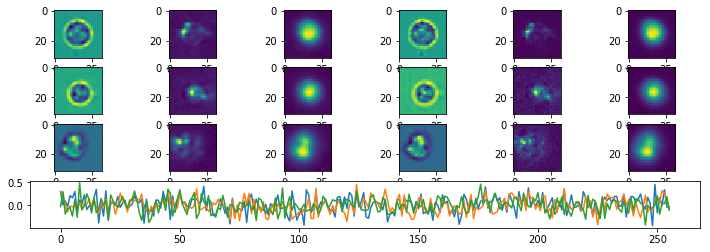

Iteration:  7100 Loss:  3.436358 3.436358 0.0
Test Loss 3.9390101
Iteration:  7200 Loss:  3.7453952 3.7453952 0.0
Test Loss 4.140853
Iteration:  7300 Loss:  3.2066312 3.2066312 0.0
Test Loss 3.8843021
Iteration:  7400 Loss:  3.29546 3.29546 0.0
Test Loss 3.9081905
Iteration:  7500 Loss:  3.148385 3.148385 0.0
Test Loss 3.876501
Iteration:  7600 Loss:  3.3783674 3.3783674 0.0
Test Loss 3.9194558
Iteration:  7700 Loss:  3.4325767 3.4325767 0.0
Test Loss 3.8582523
Iteration:  7800 Loss:  3.3764358 3.3764358 0.0
Test Loss 3.836663
Iteration:  7900 Loss:  3.1303122 3.1303122 0.0
Test Loss 3.810197
Iteration:  8000 Loss:  3.195798 3.195798 0.0
Test Loss 3.7862303
Iteration:  8000 Loss:  3.195798 3.195798 0.0
Test Loss 3.7862303


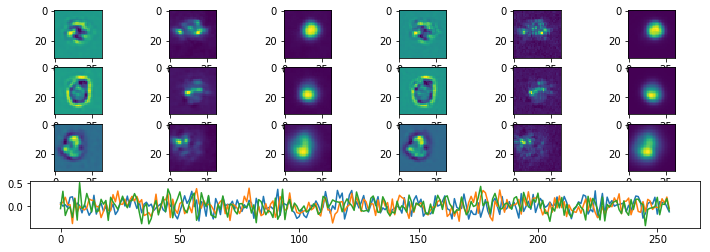

Iteration:  8100 Loss:  3.1282923 3.1282923 0.0
Test Loss 3.7902133
Iteration:  8200 Loss:  3.5225759 3.5225759 0.0
Test Loss 3.8306384
Iteration:  8300 Loss:  2.8388476 2.8388476 0.0
Test Loss 3.787909
Iteration:  8400 Loss:  2.9733913 2.9733913 0.0
Test Loss 3.7441325
Iteration:  8500 Loss:  3.1628616 3.1628616 0.0
Test Loss 3.7345295
Iteration:  8600 Loss:  3.3116875 3.3116875 0.0
Test Loss 3.721866
Iteration:  8700 Loss:  3.3689394 3.3689394 0.0
Test Loss 3.7170267
Iteration:  8800 Loss:  3.1787572 3.1787572 0.0
Test Loss 3.7025194
Iteration:  8900 Loss:  3.02795 3.02795 0.0
Test Loss 3.6952555
Iteration:  9000 Loss:  2.9291449 2.9291449 0.0
Test Loss 3.6933954
Iteration:  9000 Loss:  2.9291449 2.9291449 0.0
Test Loss 3.6933954


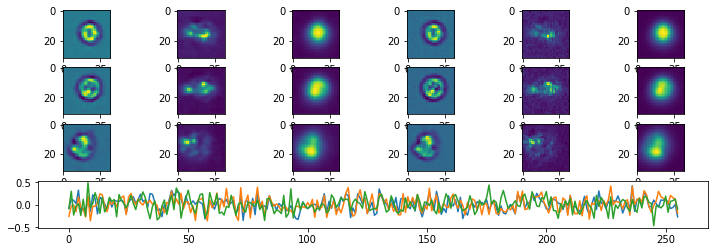

Iteration:  9100 Loss:  3.0269527 3.0269527 0.0
Test Loss 3.6778498
Iteration:  9200 Loss:  3.0129824 3.0129824 0.0
Test Loss 3.6940448
Iteration:  9300 Loss:  2.9299026 2.9299026 0.0
Test Loss 3.6627865
Iteration:  9400 Loss:  2.9509342 2.9509342 0.0
Test Loss 3.6512132
Iteration:  9500 Loss:  3.125227 3.125227 0.0
Test Loss 3.6220267
Iteration:  9600 Loss:  3.1219301 3.1219301 0.0
Test Loss 3.6424615
Iteration:  9700 Loss:  3.4040225 3.4040225 0.0
Test Loss 3.7159348
Iteration:  9800 Loss:  3.1636586 3.1636586 0.0
Test Loss 3.5934308
Iteration:  9900 Loss:  2.9968474 2.9968474 0.0
Test Loss 3.5946367
Iteration:  10000 Loss:  2.884561 2.884561 0.0
Test Loss 3.5720248
Iteration:  10000 Loss:  2.884561 2.884561 0.0
Test Loss 3.5720248


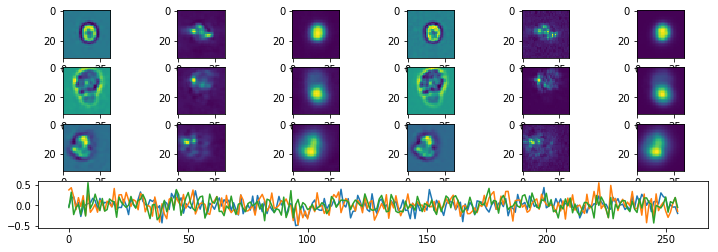

Iteration:  10100 Loss:  3.0525117 3.0525117 0.0
Test Loss 3.58467
Iteration:  10200 Loss:  3.233735 3.233735 0.0
Test Loss 3.5962796
Iteration:  10300 Loss:  3.1009047 3.1009047 0.0
Test Loss 3.5892894
Iteration:  10400 Loss:  2.9275975 2.9275975 0.0
Test Loss 3.5774755
Iteration:  10500 Loss:  3.112592 3.112592 0.0
Test Loss 3.563314
Iteration:  10600 Loss:  2.9720514 2.9720514 0.0
Test Loss 3.56437
Iteration:  10700 Loss:  2.7734447 2.7734447 0.0
Test Loss 3.545805
Iteration:  10800 Loss:  2.6945963 2.6945963 0.0
Test Loss 3.5468063
Iteration:  10900 Loss:  3.0026784 3.0026784 0.0
Test Loss 3.5245943
Iteration:  11000 Loss:  3.0857148 3.0857148 0.0
Test Loss 3.5503092
Iteration:  11000 Loss:  3.0857148 3.0857148 0.0
Test Loss 3.5503092


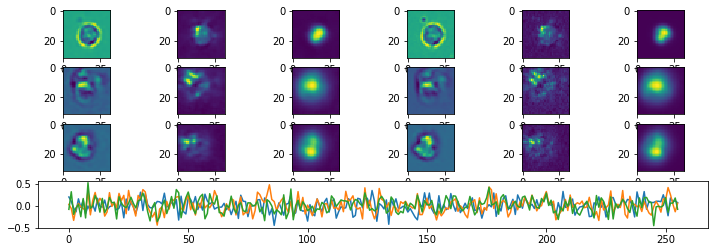

Iteration:  11100 Loss:  2.9149055 2.9149055 0.0
Test Loss 3.5097842
Iteration:  11200 Loss:  3.058831 3.058831 0.0
Test Loss 3.5233438
Iteration:  11300 Loss:  2.8716002 2.8716002 0.0
Test Loss 3.525319
Iteration:  11400 Loss:  2.77376 2.77376 0.0
Test Loss 3.4938445
Iteration:  11500 Loss:  2.8547246 2.8547246 0.0
Test Loss 3.4964347
Iteration:  11600 Loss:  2.9197662 2.9197662 0.0
Test Loss 3.4945352
Iteration:  11700 Loss:  2.9050555 2.9050555 0.0
Test Loss 3.4953794
Iteration:  11800 Loss:  2.996435 2.996435 0.0
Test Loss 3.489126
Iteration:  11900 Loss:  3.2427945 3.2427945 0.0
Test Loss 3.491256
Iteration:  12000 Loss:  2.7961829 2.7961829 0.0
Test Loss 3.4478965
Iteration:  12000 Loss:  2.7961829 2.7961829 0.0
Test Loss 3.4478965


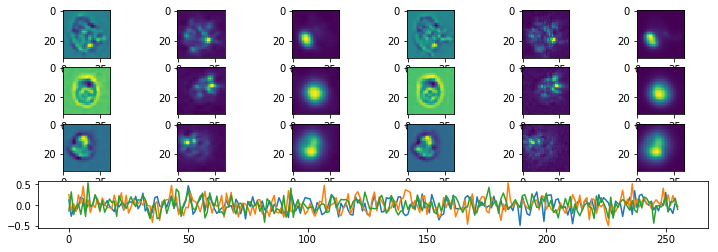

Iteration:  12100 Loss:  2.8857021 2.8857021 0.0
Test Loss 3.476401
Iteration:  12200 Loss:  2.7364154 2.7364154 0.0
Test Loss 3.4540668
Iteration:  12300 Loss:  2.6871202 2.6871202 0.0
Test Loss 3.4450896
Iteration:  12400 Loss:  3.0690265 3.0690265 0.0
Test Loss 3.461238
Iteration:  12500 Loss:  2.768918 2.768918 0.0
Test Loss 3.4586859
Iteration:  12600 Loss:  2.7390633 2.7390633 0.0
Test Loss 3.434817
Iteration:  12700 Loss:  2.6881967 2.6881967 0.0
Test Loss 3.5087516
Iteration:  12800 Loss:  3.0042741 3.0042741 0.0
Test Loss 3.4613314
Iteration:  12900 Loss:  2.5837588 2.5837588 0.0
Test Loss 3.4392552
Iteration:  13000 Loss:  2.7682934 2.7682934 0.0
Test Loss 3.4269164
Iteration:  13000 Loss:  2.7682934 2.7682934 0.0
Test Loss 3.4269164


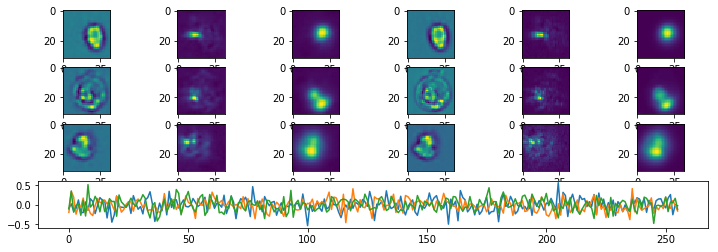

Iteration:  13100 Loss:  2.7243273 2.7243273 0.0
Test Loss 3.4155881
Iteration:  13200 Loss:  2.8380446 2.8380446 0.0
Test Loss 3.4028282
Iteration:  13300 Loss:  2.8333359 2.8333359 0.0
Test Loss 3.3965697
Iteration:  13400 Loss:  2.8318868 2.8318868 0.0
Test Loss 3.4016793
Iteration:  13500 Loss:  2.5678458 2.5678458 0.0
Test Loss 3.3987923
Iteration:  13600 Loss:  2.577669 2.577669 0.0
Test Loss 3.402551
Iteration:  13700 Loss:  2.755925 2.755925 0.0
Test Loss 3.4026504
Iteration:  13800 Loss:  2.89362 2.89362 0.0
Test Loss 3.3811848
Iteration:  13900 Loss:  2.4971232 2.4971232 0.0
Test Loss 3.3826463
Iteration:  14000 Loss:  2.667105 2.667105 0.0
Test Loss 3.376979
Iteration:  14000 Loss:  2.667105 2.667105 0.0
Test Loss 3.376979


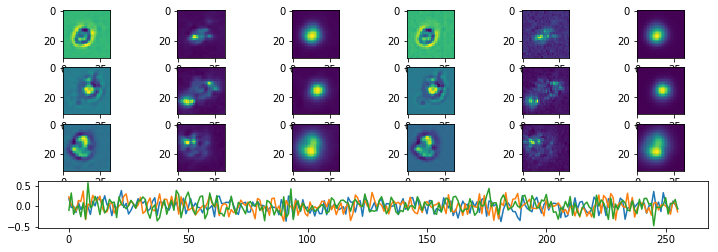

Iteration:  14100 Loss:  2.6116323 2.6116323 0.0
Test Loss 3.3773675
Iteration:  14200 Loss:  2.821639 2.821639 0.0
Test Loss 3.3705568
Iteration:  14300 Loss:  2.7618995 2.7618995 0.0
Test Loss 3.3742363
Iteration:  14400 Loss:  2.718334 2.718334 0.0
Test Loss 3.3720713
Iteration:  14500 Loss:  2.7609148 2.7609148 0.0
Test Loss 3.3531313
Iteration:  14600 Loss:  3.1026256 3.1026256 0.0
Test Loss 3.3719258
Iteration:  14700 Loss:  2.6664195 2.6664195 0.0
Test Loss 3.350207
Iteration:  14800 Loss:  2.5730004 2.5730004 0.0
Test Loss 3.3562949
Iteration:  14900 Loss:  2.7615871 2.7615871 0.0
Test Loss 3.347904
Iteration:  15000 Loss:  2.575743 2.575743 0.0
Test Loss 3.3459334
Iteration:  15000 Loss:  2.575743 2.575743 0.0
Test Loss 3.3459334


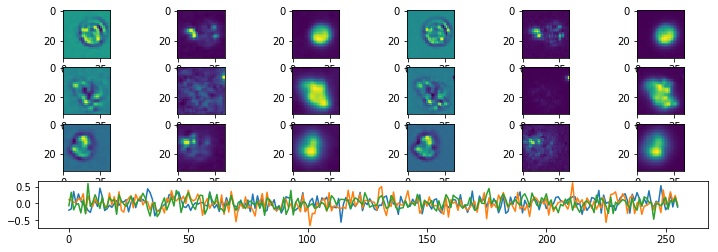

Iteration:  15100 Loss:  2.665607 2.665607 0.0
Test Loss 3.3640175
Iteration:  15200 Loss:  2.4919603 2.4919603 0.0
Test Loss 3.3566015
Iteration:  15300 Loss:  2.8166351 2.8166351 0.0
Test Loss 3.3376985
Iteration:  15400 Loss:  2.577689 2.577689 0.0
Test Loss 3.335075
Iteration:  15500 Loss:  2.5734155 2.5734155 0.0
Test Loss 3.3795102
Iteration:  15600 Loss:  2.4897604 2.4897604 0.0
Test Loss 3.3318143
Iteration:  15700 Loss:  2.8977773 2.8977773 0.0
Test Loss 3.3510284
Iteration:  15800 Loss:  2.7393672 2.7393672 0.0
Test Loss 3.3071263
Iteration:  15900 Loss:  2.6661751 2.6661751 0.0
Test Loss 3.3369184
Iteration:  16000 Loss:  2.7605546 2.7605546 0.0
Test Loss 3.3382607
Iteration:  16000 Loss:  2.7605546 2.7605546 0.0
Test Loss 3.3382607


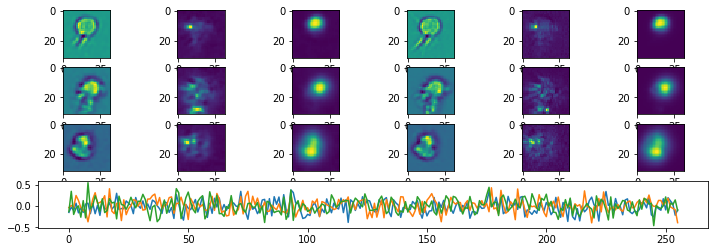

Iteration:  16100 Loss:  2.5200145 2.5200145 0.0
Test Loss 3.3185225
Iteration:  16200 Loss:  2.6748936 2.6748936 0.0
Test Loss 3.3141057
Iteration:  16300 Loss:  2.5379333 2.5379333 0.0
Test Loss 3.3515418
Iteration:  16400 Loss:  2.8638253 2.8638253 0.0
Test Loss 3.4389622
Iteration:  16500 Loss:  2.6482658 2.6482658 0.0
Test Loss 3.3193107
Iteration:  16600 Loss:  2.3850725 2.3850725 0.0
Test Loss 3.287867
Iteration:  16700 Loss:  2.6098218 2.6098218 0.0
Test Loss 3.299975
Iteration:  16800 Loss:  2.4952404 2.4952404 0.0
Test Loss 3.3050096
Iteration:  16900 Loss:  2.50677 2.50677 0.0
Test Loss 3.3099642
Iteration:  17000 Loss:  2.7671294 2.7671294 0.0
Test Loss 3.3123279
Iteration:  17000 Loss:  2.7671294 2.7671294 0.0
Test Loss 3.3123279


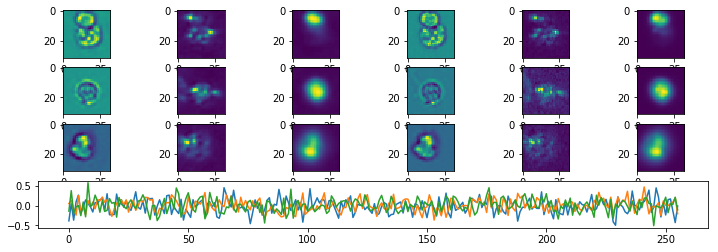

Iteration:  17100 Loss:  2.675028 2.675028 0.0
Test Loss 3.2805216
Iteration:  17200 Loss:  2.3421402 2.3421402 0.0
Test Loss 3.2826443
Iteration:  17300 Loss:  2.5377808 2.5377808 0.0
Test Loss 3.2954748
Iteration:  17400 Loss:  2.9247541 2.9247541 0.0
Test Loss 3.2917235
Iteration:  17500 Loss:  2.5232437 2.5232437 0.0
Test Loss 3.293204
Iteration:  17600 Loss:  2.5984707 2.5984707 0.0
Test Loss 3.291803
Iteration:  17700 Loss:  2.3161974 2.3161974 0.0
Test Loss 3.2770338
Iteration:  17800 Loss:  2.5731747 2.5731747 0.0
Test Loss 3.2823339
Iteration:  17900 Loss:  2.7406874 2.7406874 0.0
Test Loss 3.2921262
Iteration:  18000 Loss:  2.3431628 2.3431628 0.0
Test Loss 3.2733822
Iteration:  18000 Loss:  2.3431628 2.3431628 0.0
Test Loss 3.2733822


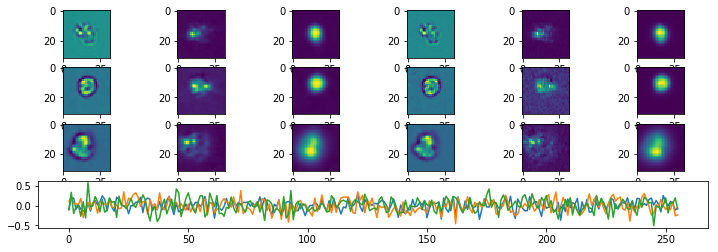

Iteration:  18100 Loss:  2.5425417 2.5425417 0.0
Test Loss 3.25883
Iteration:  18200 Loss:  2.8520555 2.8520555 0.0
Test Loss 3.318273
Iteration:  18300 Loss:  2.3135564 2.3135564 0.0
Test Loss 3.2573586
Iteration:  18400 Loss:  2.4456315 2.4456315 0.0
Test Loss 3.2627728
Iteration:  18500 Loss:  2.4606256 2.4606256 0.0
Test Loss 3.273224
Iteration:  18600 Loss:  2.6578069 2.6578069 0.0
Test Loss 3.3166418
Iteration:  18700 Loss:  2.4912663 2.4912663 0.0
Test Loss 3.3155186
Iteration:  18800 Loss:  2.5860307 2.5860307 0.0
Test Loss 3.2528195
Iteration:  18900 Loss:  2.588773 2.588773 0.0
Test Loss 3.2454076
Iteration:  19000 Loss:  2.607359 2.607359 0.0
Test Loss 3.2696137
Iteration:  19000 Loss:  2.607359 2.607359 0.0
Test Loss 3.2696137


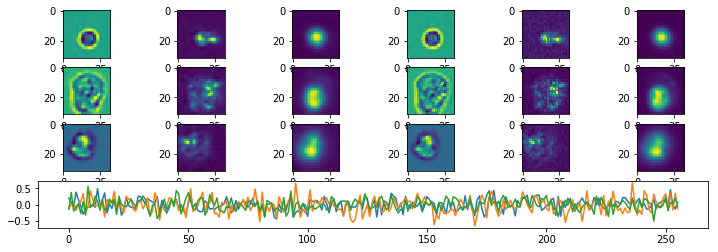

Iteration:  19100 Loss:  2.4949353 2.4949353 0.0
Test Loss 3.2718315
Iteration:  19200 Loss:  2.3484612 2.3484612 0.0
Test Loss 3.2474544
Iteration:  19300 Loss:  2.5443473 2.5443473 0.0
Test Loss 3.2860928
Iteration:  19400 Loss:  2.5626884 2.5626884 0.0
Test Loss 3.255255
Iteration:  19500 Loss:  2.3874505 2.3874505 0.0
Test Loss 3.2428837
Iteration:  19600 Loss:  2.3627152 2.3627152 0.0
Test Loss 3.237724
Iteration:  19700 Loss:  2.4856913 2.4856913 0.0
Test Loss 3.2340279
Iteration:  19800 Loss:  2.4617925 2.4617925 0.0
Test Loss 3.2493582
Iteration:  19900 Loss:  2.522472 2.522472 0.0
Test Loss 3.237755
Iteration:  20000 Loss:  2.4095056 2.4095056 0.0
Test Loss 3.2483335
Iteration:  20000 Loss:  2.4095056 2.4095056 0.0
Test Loss 3.2483335


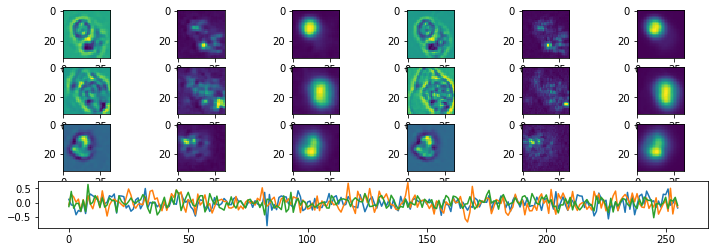

Iteration:  20100 Loss:  2.4123003 2.4123003 0.0
Test Loss 3.2685008
Iteration:  20200 Loss:  2.498056 2.498056 0.0
Test Loss 3.2285395
Iteration:  20300 Loss:  2.5733426 2.5733426 0.0
Test Loss 3.2617016
Iteration:  20400 Loss:  2.4352415 2.4352415 0.0
Test Loss 3.2304623
Iteration:  20500 Loss:  2.2658281 2.2658281 0.0
Test Loss 3.2437382
Iteration:  20600 Loss:  2.3493001 2.3493001 0.0
Test Loss 3.2337089
Iteration:  20700 Loss:  2.4000478 2.4000478 0.0
Test Loss 3.2238736
Iteration:  20800 Loss:  2.5093303 2.5093303 0.0
Test Loss 3.2098784
Iteration:  20900 Loss:  2.4613938 2.4613938 0.0
Test Loss 3.2658434
Iteration:  21000 Loss:  2.472272 2.472272 0.0
Test Loss 3.216617
Iteration:  21000 Loss:  2.472272 2.472272 0.0
Test Loss 3.216617


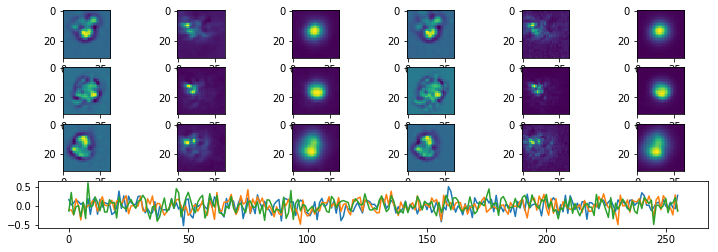

Iteration:  21100 Loss:  2.61588 2.61588 0.0
Test Loss 3.3797739
Iteration:  21200 Loss:  2.491988 2.491988 0.0
Test Loss 3.2103689
Iteration:  21300 Loss:  2.501111 2.501111 0.0
Test Loss 3.2206483
Iteration:  21400 Loss:  2.522676 2.522676 0.0
Test Loss 3.2249007
Iteration:  21500 Loss:  2.5344925 2.5344925 0.0
Test Loss 3.231028
Iteration:  21600 Loss:  2.3379827 2.3379827 0.0
Test Loss 3.1972482
Iteration:  21700 Loss:  2.3835711 2.3835711 0.0
Test Loss 3.232275
Iteration:  21800 Loss:  2.422282 2.422282 0.0
Test Loss 3.2197323
Iteration:  21900 Loss:  2.291149 2.291149 0.0
Test Loss 3.2214384
Iteration:  22000 Loss:  2.3152394 2.3152394 0.0
Test Loss 3.2008307
Iteration:  22000 Loss:  2.3152394 2.3152394 0.0
Test Loss 3.2008307


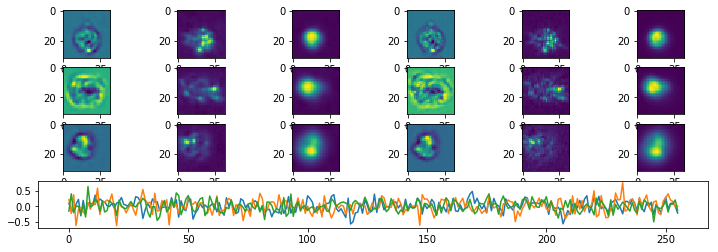

Iteration:  22100 Loss:  2.3595486 2.3595486 0.0
Test Loss 3.2460132
Iteration:  22200 Loss:  2.5024424 2.5024424 0.0
Test Loss 3.2237062
Iteration:  22300 Loss:  2.6763546 2.6763546 0.0
Test Loss 3.3199358
Iteration:  22400 Loss:  2.6299415 2.6299415 0.0
Test Loss 3.211335
Iteration:  22500 Loss:  2.4716907 2.4716907 0.0
Test Loss 3.1859822
Iteration:  22600 Loss:  2.178202 2.178202 0.0
Test Loss 3.1979802
Iteration:  22700 Loss:  2.2257507 2.2257507 0.0
Test Loss 3.177621
Iteration:  22800 Loss:  2.2246475 2.2246475 0.0
Test Loss 3.1815114
Iteration:  22900 Loss:  2.4003677 2.4003677 0.0
Test Loss 3.184988
Iteration:  23000 Loss:  2.2632365 2.2632365 0.0
Test Loss 3.214713
Iteration:  23000 Loss:  2.2632365 2.2632365 0.0
Test Loss 3.214713


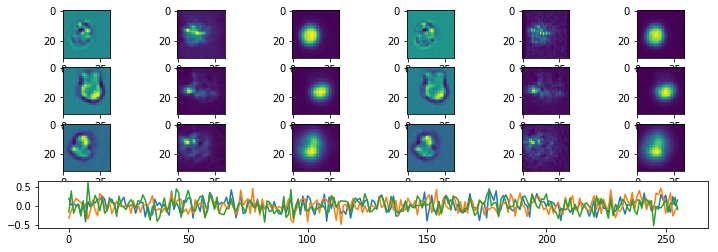

Iteration:  23100 Loss:  2.3249514 2.3249514 0.0
Test Loss 3.207526
Iteration:  23200 Loss:  2.420447 2.420447 0.0
Test Loss 3.1742883
Iteration:  23300 Loss:  2.3129194 2.3129194 0.0
Test Loss 3.1895773
Iteration:  23400 Loss:  2.5722523 2.5722523 0.0
Test Loss 3.1685152
Iteration:  23500 Loss:  2.2921906 2.2921906 0.0
Test Loss 3.1865773
Iteration:  23600 Loss:  2.5057745 2.5057745 0.0
Test Loss 3.182537
Iteration:  23700 Loss:  2.4005063 2.4005063 0.0
Test Loss 3.2037897
Iteration:  23800 Loss:  2.465713 2.465713 0.0
Test Loss 3.192499
Iteration:  23900 Loss:  2.4459677 2.4459677 0.0
Test Loss 3.1927373
Iteration:  24000 Loss:  2.517541 2.517541 0.0
Test Loss 3.1706245
Iteration:  24000 Loss:  2.517541 2.517541 0.0
Test Loss 3.1706245


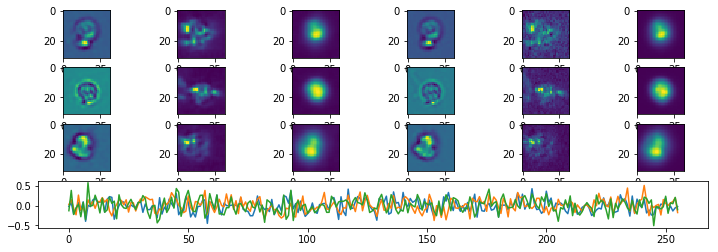

Iteration:  24100 Loss:  2.1115155 2.1115155 0.0
Test Loss 3.1732588
Iteration:  24200 Loss:  2.354321 2.354321 0.0
Test Loss 3.1819773
Iteration:  24300 Loss:  2.3861856 2.3861856 0.0
Test Loss 3.1966405
Iteration:  24400 Loss:  2.2845058 2.2845058 0.0
Test Loss 3.1676054
Iteration:  24500 Loss:  2.3223407 2.3223407 0.0
Test Loss 3.1582038
Iteration:  24600 Loss:  2.3741057 2.3741057 0.0
Test Loss 3.1962833
Iteration:  24700 Loss:  2.3911357 2.3911357 0.0
Test Loss 3.174841
Iteration:  24800 Loss:  2.3500807 2.3500807 0.0
Test Loss 3.170085
Iteration:  24900 Loss:  2.3262348 2.3262348 0.0
Test Loss 3.164419
Iteration:  25000 Loss:  2.3541377 2.3541377 0.0
Test Loss 3.1576717
Iteration:  25000 Loss:  2.3541377 2.3541377 0.0
Test Loss 3.1576717


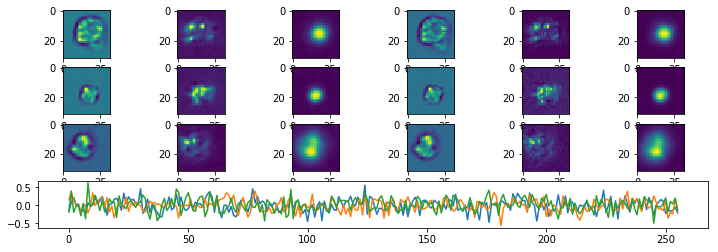

Iteration:  25100 Loss:  2.5540376 2.5540376 0.0
Test Loss 3.2054472
Iteration:  25200 Loss:  2.3201504 2.3201504 0.0
Test Loss 3.1582975
Iteration:  25300 Loss:  2.2005935 2.2005935 0.0
Test Loss 3.1762493
Iteration:  25400 Loss:  2.1939886 2.1939886 0.0
Test Loss 3.1771562
Iteration:  25500 Loss:  2.4239364 2.4239364 0.0
Test Loss 3.1840994
Iteration:  25600 Loss:  2.3008037 2.3008037 0.0
Test Loss 3.1878867
Iteration:  25700 Loss:  2.288259 2.288259 0.0
Test Loss 3.145944
Iteration:  25800 Loss:  2.324111 2.324111 0.0
Test Loss 3.165979
Iteration:  25900 Loss:  2.2739084 2.2739084 0.0
Test Loss 3.1653008
Iteration:  26000 Loss:  2.4548626 2.4548626 0.0
Test Loss 3.1531537
Iteration:  26000 Loss:  2.4548626 2.4548626 0.0
Test Loss 3.1531537


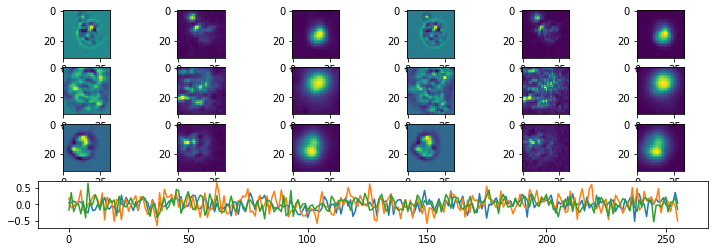

Iteration:  26100 Loss:  2.1128151 2.1128151 0.0
Test Loss 3.1582398
Iteration:  26200 Loss:  2.313058 2.313058 0.0
Test Loss 3.1500468
Iteration:  26300 Loss:  2.4157832 2.4157832 0.0
Test Loss 3.1712396
Iteration:  26400 Loss:  2.2765532 2.2765532 0.0
Test Loss 3.1455357
Iteration:  26500 Loss:  2.3824062 2.3824062 0.0
Test Loss 3.1652377
Iteration:  26600 Loss:  2.229872 2.229872 0.0
Test Loss 3.1499422
Iteration:  26700 Loss:  2.2421193 2.2421193 0.0
Test Loss 3.148835
Iteration:  26800 Loss:  2.3885152 2.3885152 0.0
Test Loss 3.1434262
Iteration:  26900 Loss:  2.2602432 2.2602432 0.0
Test Loss 3.1694171
Iteration:  27000 Loss:  2.4313731 2.4313731 0.0
Test Loss 3.159762
Iteration:  27000 Loss:  2.4313731 2.4313731 0.0
Test Loss 3.159762


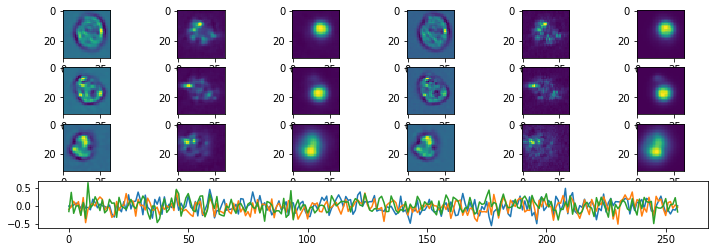

Iteration:  27100 Loss:  2.434653 2.434653 0.0
Test Loss 3.152724
Iteration:  27200 Loss:  2.312841 2.312841 0.0
Test Loss 3.171976
Iteration:  27300 Loss:  2.0109043 2.0109043 0.0
Test Loss 3.1332364
Iteration:  27400 Loss:  2.3738804 2.3738804 0.0
Test Loss 3.1419008
Iteration:  27500 Loss:  2.1960735 2.1960735 0.0
Test Loss 3.1584687
Iteration:  27600 Loss:  2.2055068 2.2055068 0.0
Test Loss 3.162414
Iteration:  27700 Loss:  2.2451322 2.2451322 0.0
Test Loss 3.1594148
Iteration:  27800 Loss:  2.3591535 2.3591535 0.0
Test Loss 3.1527076
Iteration:  27900 Loss:  2.3554742 2.3554742 0.0
Test Loss 3.1698585
Iteration:  28000 Loss:  2.3086402 2.3086402 0.0
Test Loss 3.1515534
Iteration:  28000 Loss:  2.3086402 2.3086402 0.0
Test Loss 3.1515534


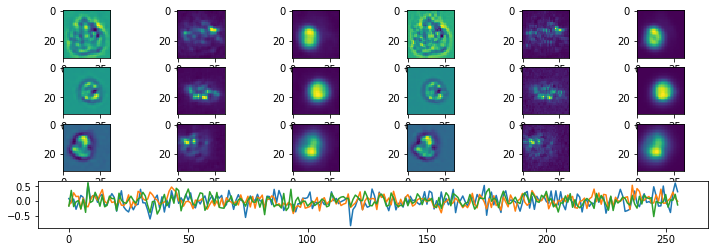

Iteration:  28100 Loss:  2.2052789 2.2052789 0.0
Test Loss 3.1484756
Iteration:  28200 Loss:  2.1984572 2.1984572 0.0
Test Loss 3.133628
Iteration:  28300 Loss:  2.338573 2.338573 0.0
Test Loss 3.133466
Iteration:  28400 Loss:  2.2086177 2.2086177 0.0
Test Loss 3.1757815
Iteration:  28500 Loss:  2.2428782 2.2428782 0.0
Test Loss 3.147334
Iteration:  28600 Loss:  2.363997 2.363997 0.0
Test Loss 3.1241622
Iteration:  28700 Loss:  2.1300564 2.1300564 0.0
Test Loss 3.1489239
Iteration:  28800 Loss:  2.4039009 2.4039009 0.0
Test Loss 3.154925
Iteration:  28900 Loss:  2.2645478 2.2645478 0.0
Test Loss 3.1631987
Iteration:  29000 Loss:  2.0491018 2.0491018 0.0
Test Loss 3.1327496
Iteration:  29000 Loss:  2.0491018 2.0491018 0.0
Test Loss 3.1327496


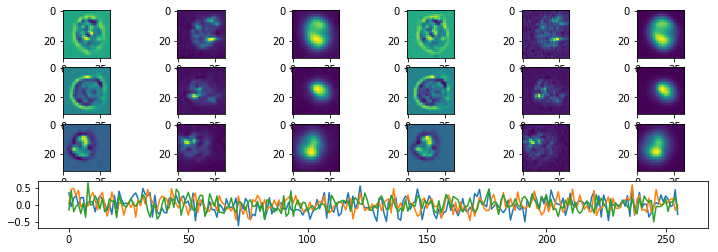

Iteration:  29100 Loss:  2.3495383 2.3495383 0.0
Test Loss 3.1399872
Iteration:  29200 Loss:  2.2301774 2.2301774 0.0
Test Loss 3.1504405
Iteration:  29300 Loss:  2.357707 2.357707 0.0
Test Loss 3.1813405
Iteration:  29400 Loss:  2.2709882 2.2709882 0.0
Test Loss 3.1352634
Iteration:  29500 Loss:  2.2488518 2.2488518 0.0
Test Loss 3.1344364
Iteration:  29600 Loss:  2.2169433 2.2169433 0.0
Test Loss 3.1310403
Iteration:  29700 Loss:  2.2339134 2.2339134 0.0
Test Loss 3.1255777
Iteration:  29800 Loss:  2.183066 2.183066 0.0
Test Loss 3.124693
Iteration:  29900 Loss:  2.2028112 2.2028112 0.0
Test Loss 3.1388443
Iteration:  30000 Loss:  2.1392612 2.1392612 0.0
Test Loss 3.128833
Iteration:  30000 Loss:  2.1392612 2.1392612 0.0
Test Loss 3.128833


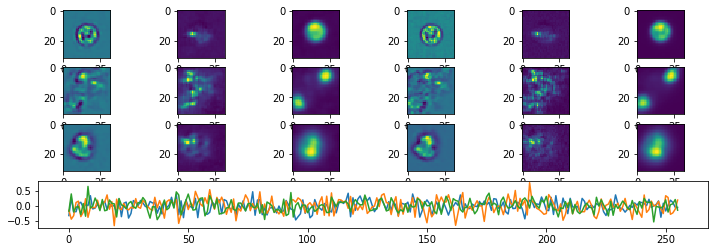

Iteration:  30100 Loss:  2.0663662 2.0663662 0.0
Test Loss 3.1361806
Iteration:  30200 Loss:  2.1902747 2.1902747 0.0
Test Loss 3.1408677
Iteration:  30300 Loss:  1.9936559 1.9936559 0.0
Test Loss 3.1457813
Iteration:  30400 Loss:  2.1508834 2.1508834 0.0
Test Loss 3.114485
Iteration:  30500 Loss:  2.2651033 2.2651033 0.0
Test Loss 3.1395473
Iteration:  30600 Loss:  2.1527832 2.1527832 0.0
Test Loss 3.136914
Iteration:  30700 Loss:  2.4577115 2.4577115 0.0
Test Loss 3.1379523
Iteration:  30800 Loss:  2.2094178 2.2094178 0.0
Test Loss 3.1433487
Iteration:  30900 Loss:  2.0827487 2.0827487 0.0
Test Loss 3.1301699
Iteration:  31000 Loss:  2.1173337 2.1173337 0.0
Test Loss 3.1320946
Iteration:  31000 Loss:  2.1173337 2.1173337 0.0
Test Loss 3.1320946


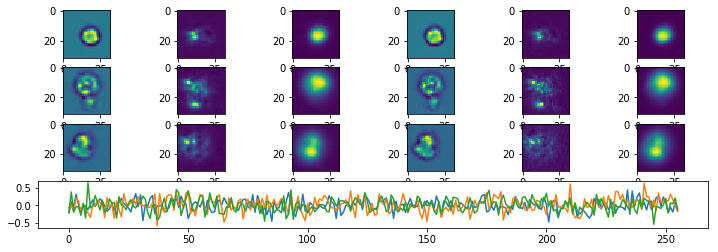

Iteration:  31100 Loss:  2.0419724 2.0419724 0.0
Test Loss 3.1285772
Iteration:  31200 Loss:  2.2075596 2.2075596 0.0
Test Loss 3.1120915
Iteration:  31300 Loss:  2.0897973 2.0897973 0.0
Test Loss 3.1301641
Iteration:  31400 Loss:  2.1735222 2.1735222 0.0
Test Loss 3.135635
Iteration:  31500 Loss:  2.2781584 2.2781584 0.0
Test Loss 3.1259508
Iteration:  31600 Loss:  2.1895633 2.1895633 0.0
Test Loss 3.1605694
Iteration:  31700 Loss:  2.1275072 2.1275072 0.0
Test Loss 3.117622
Iteration:  31800 Loss:  2.28192 2.28192 0.0
Test Loss 3.1229293
Iteration:  31900 Loss:  2.2577138 2.2577138 0.0
Test Loss 3.1236143
Iteration:  32000 Loss:  2.3900018 2.3900018 0.0
Test Loss 3.1298184
Iteration:  32000 Loss:  2.3900018 2.3900018 0.0
Test Loss 3.1298184


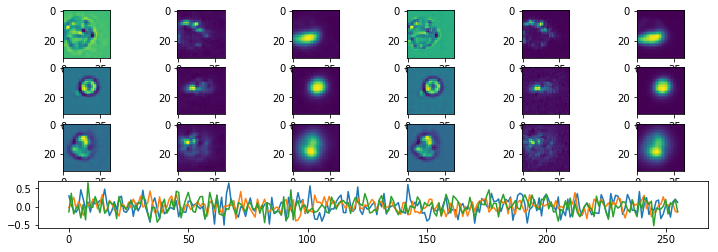

Iteration:  32100 Loss:  2.339935 2.339935 0.0
Test Loss 3.1234045
Iteration:  32200 Loss:  2.1585398 2.1585398 0.0
Test Loss 3.1237252
Iteration:  32300 Loss:  2.2759233 2.2759233 0.0
Test Loss 3.1025727
Iteration:  32400 Loss:  2.4567137 2.4567137 0.0
Test Loss 3.1135244
Iteration:  32500 Loss:  2.173091 2.173091 0.0
Test Loss 3.1322155
Iteration:  32600 Loss:  2.0657196 2.0657196 0.0
Test Loss 3.1114867
Iteration:  32700 Loss:  2.306777 2.306777 0.0
Test Loss 3.1216607
Iteration:  32800 Loss:  2.1494179 2.1494179 0.0
Test Loss 3.1166055
Iteration:  32900 Loss:  2.3433292 2.3433292 0.0
Test Loss 3.1290753
Iteration:  33000 Loss:  2.213397 2.213397 0.0
Test Loss 3.1316195
Iteration:  33000 Loss:  2.213397 2.213397 0.0
Test Loss 3.1316195


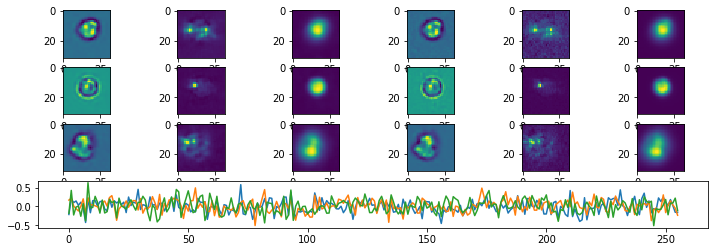

Iteration:  33100 Loss:  2.0024471 2.0024471 0.0
Test Loss 3.1255274
Iteration:  33200 Loss:  2.1728783 2.1728783 0.0
Test Loss 3.1187136
Iteration:  33300 Loss:  2.2678318 2.2678318 0.0
Test Loss 3.1159408
Iteration:  33400 Loss:  2.159007 2.159007 0.0
Test Loss 3.1241665
Iteration:  33500 Loss:  2.1997204 2.1997204 0.0
Test Loss 3.1673052
Iteration:  33600 Loss:  2.3773823 2.3773823 0.0
Test Loss 3.1176991
Iteration:  33700 Loss:  2.1474037 2.1474037 0.0
Test Loss 3.1166847
Iteration:  33800 Loss:  2.2604918 2.2604918 0.0
Test Loss 3.1122751
Iteration:  33900 Loss:  2.1896482 2.1896482 0.0
Test Loss 3.1371841
Iteration:  34000 Loss:  2.0952244 2.0952244 0.0
Test Loss 3.1110065
Iteration:  34000 Loss:  2.0952244 2.0952244 0.0
Test Loss 3.1110065


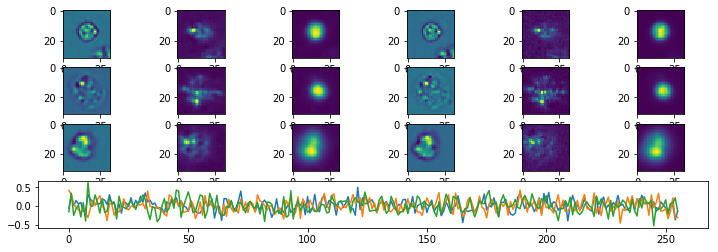

Iteration:  34100 Loss:  2.3785276 2.3785276 0.0
Test Loss 3.1319804
Iteration:  34200 Loss:  2.1933925 2.1933925 0.0
Test Loss 3.1538806
Iteration:  34300 Loss:  1.9850051 1.9850051 0.0
Test Loss 3.1283383
Iteration:  34400 Loss:  2.1583726 2.1583726 0.0
Test Loss 3.135974
Iteration:  34500 Loss:  2.1924765 2.1924765 0.0
Test Loss 3.12712
Iteration:  34600 Loss:  2.1210308 2.1210308 0.0
Test Loss 3.1202352
Iteration:  34700 Loss:  2.2328618 2.2328618 0.0
Test Loss 3.1178622
Iteration:  34800 Loss:  2.149531 2.149531 0.0
Test Loss 3.111063
Iteration:  34900 Loss:  2.1334877 2.1334877 0.0
Test Loss 3.1154869
Iteration:  35000 Loss:  2.1866815 2.1866815 0.0
Test Loss 3.1337547
Iteration:  35000 Loss:  2.1866815 2.1866815 0.0
Test Loss 3.1337547


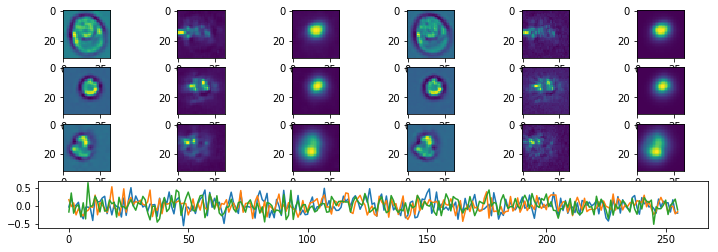

Iteration:  35100 Loss:  2.1409721 2.1409721 0.0
Test Loss 3.1572309
Iteration:  35200 Loss:  1.9860553 1.9860553 0.0
Test Loss 3.127015
Iteration:  35300 Loss:  2.103539 2.103539 0.0
Test Loss 3.105236
Iteration:  35400 Loss:  2.0394192 2.0394192 0.0
Test Loss 3.1245484
Iteration:  35500 Loss:  2.095203 2.095203 0.0
Test Loss 3.1365907
Iteration:  35600 Loss:  2.2411427 2.2411427 0.0
Test Loss 3.1221147
Iteration:  35700 Loss:  2.198485 2.198485 0.0
Test Loss 3.1166873
Iteration:  35800 Loss:  2.2226062 2.2226062 0.0
Test Loss 3.1418161
Iteration:  35900 Loss:  2.0176072 2.0176072 0.0
Test Loss 3.1053207
Iteration:  36000 Loss:  2.2041147 2.2041147 0.0
Test Loss 3.111338
Iteration:  36000 Loss:  2.2041147 2.2041147 0.0
Test Loss 3.111338


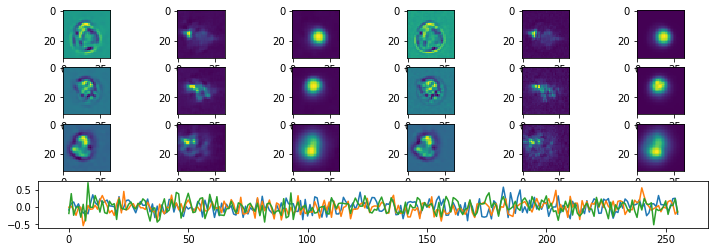

Iteration:  36100 Loss:  2.1213846 2.1213846 0.0
Test Loss 3.116388
Iteration:  36200 Loss:  2.0685937 2.0685937 0.0
Test Loss 3.116078
Iteration:  36300 Loss:  2.0600603 2.0600603 0.0
Test Loss 3.0957055
Iteration:  36400 Loss:  1.9414618 1.9414618 0.0
Test Loss 3.1126373
Iteration:  36500 Loss:  2.1192908 2.1192908 0.0
Test Loss 3.1056879
Iteration:  36600 Loss:  2.0744264 2.0744264 0.0
Test Loss 3.1112115
Iteration:  36700 Loss:  2.1162212 2.1162212 0.0
Test Loss 3.120079
Iteration:  36800 Loss:  2.1531267 2.1531267 0.0
Test Loss 3.11499
Iteration:  36900 Loss:  2.1961286 2.1961286 0.0
Test Loss 3.1104965
Iteration:  37000 Loss:  2.0554357 2.0554357 0.0
Test Loss 3.1682754
Iteration:  37000 Loss:  2.0554357 2.0554357 0.0
Test Loss 3.1682754


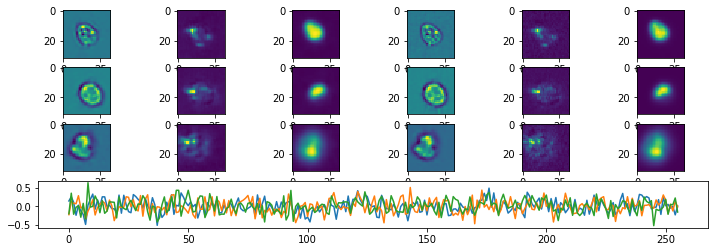

Iteration:  37100 Loss:  2.0516422 2.0516422 0.0
Test Loss 3.1245427
Iteration:  37200 Loss:  2.1170235 2.1170235 0.0
Test Loss 3.1118295
Iteration:  37300 Loss:  2.0014386 2.0014386 0.0
Test Loss 3.1197672
Iteration:  37400 Loss:  2.020772 2.020772 0.0
Test Loss 3.1389027
Iteration:  37500 Loss:  1.9702966 1.9702966 0.0
Test Loss 3.1154556
Iteration:  37600 Loss:  2.1341617 2.1341617 0.0
Test Loss 3.1642175
Iteration:  37700 Loss:  2.0452228 2.0452228 0.0
Test Loss 3.107176
Iteration:  37800 Loss:  2.1114552 2.1114552 0.0
Test Loss 3.0916197
Iteration:  37900 Loss:  2.1110287 2.1110287 0.0
Test Loss 3.1063936
Iteration:  38000 Loss:  2.0524628 2.0524628 0.0
Test Loss 3.118155
Iteration:  38000 Loss:  2.0524628 2.0524628 0.0
Test Loss 3.118155


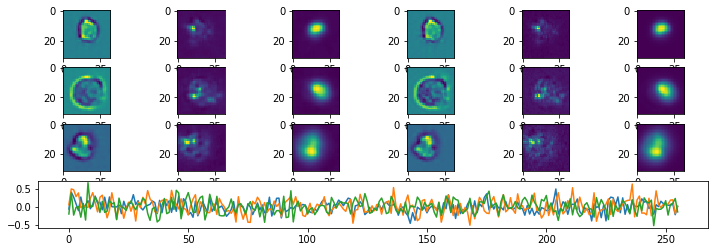

Iteration:  38100 Loss:  1.9634466 1.9634466 0.0
Test Loss 3.115072
Iteration:  38200 Loss:  2.1991396 2.1991396 0.0
Test Loss 3.1136396
Iteration:  38300 Loss:  2.1364784 2.1364784 0.0
Test Loss 3.1276684
Iteration:  38400 Loss:  1.9265707 1.9265707 0.0
Test Loss 3.108809
Iteration:  38500 Loss:  2.0907042 2.0907042 0.0
Test Loss 3.099725
Iteration:  38600 Loss:  2.0749674 2.0749674 0.0
Test Loss 3.0981088
Iteration:  38700 Loss:  2.1167264 2.1167264 0.0
Test Loss 3.1138391
Iteration:  38800 Loss:  1.9843093 1.9843093 0.0
Test Loss 3.1118832
Iteration:  38900 Loss:  2.072636 2.072636 0.0
Test Loss 3.140719
Iteration:  39000 Loss:  1.9882671 1.9882671 0.0
Test Loss 3.1166856
Iteration:  39000 Loss:  1.9882671 1.9882671 0.0
Test Loss 3.1166856


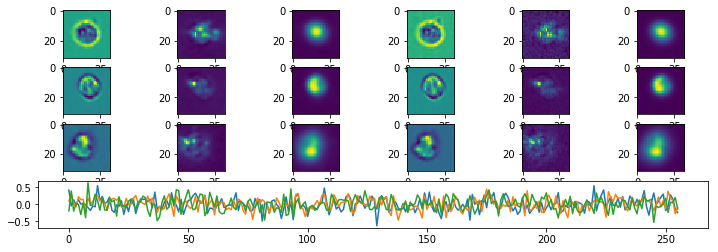

Iteration:  39100 Loss:  2.2335956 2.2335956 0.0
Test Loss 3.1312947
Iteration:  39200 Loss:  2.1628633 2.1628633 0.0
Test Loss 3.1038582
Iteration:  39300 Loss:  1.9704199 1.9704199 0.0
Test Loss 3.1074557
Iteration:  39400 Loss:  2.2739377 2.2739377 0.0
Test Loss 3.1261303
Iteration:  39500 Loss:  2.0304582 2.0304582 0.0
Test Loss 3.1092777
Iteration:  39600 Loss:  2.002817 2.002817 0.0
Test Loss 3.1034293
Iteration:  39700 Loss:  1.9080582 1.9080582 0.0
Test Loss 3.1122217
Iteration:  39800 Loss:  2.0070834 2.0070834 0.0
Test Loss 3.0964732
Iteration:  39900 Loss:  2.0132675 2.0132675 0.0
Test Loss 3.10261
Iteration:  40000 Loss:  1.9922631 1.9922631 0.0
Test Loss 3.1016319
Iteration:  40000 Loss:  1.9922631 1.9922631 0.0
Test Loss 3.1016319


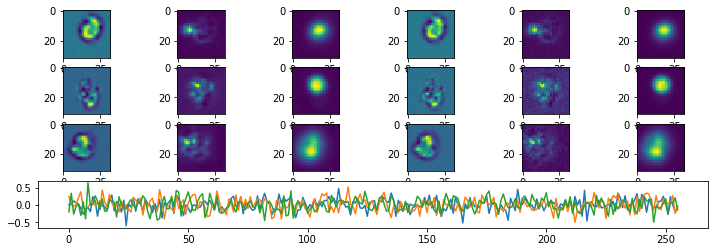

Iteration:  40100 Loss:  1.9681101 1.9681101 0.0
Test Loss 3.0974624
Iteration:  40200 Loss:  2.114024 2.114024 0.0
Test Loss 3.1182857
Iteration:  40300 Loss:  2.1050663 2.1050663 0.0
Test Loss 3.14955
Iteration:  40400 Loss:  2.137196 2.137196 0.0
Test Loss 3.1128762
Iteration:  40500 Loss:  2.0328596 2.0328596 0.0
Test Loss 3.1224444
Iteration:  40600 Loss:  1.9375378 1.9375378 0.0
Test Loss 3.1076717
Iteration:  40700 Loss:  2.0938663 2.0938663 0.0
Test Loss 3.115282
Iteration:  40800 Loss:  2.270349 2.270349 0.0
Test Loss 3.1211689
Iteration:  40900 Loss:  2.1024706 2.1024706 0.0
Test Loss 3.0996702
Iteration:  41000 Loss:  1.9831655 1.9831655 0.0
Test Loss 3.1041307
Iteration:  41000 Loss:  1.9831655 1.9831655 0.0
Test Loss 3.1041307


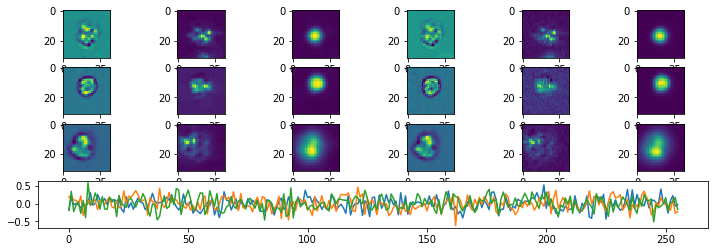

Iteration:  41100 Loss:  2.1975548 2.1975548 0.0
Test Loss 3.1037383
Iteration:  41200 Loss:  2.1767237 2.1767237 0.0
Test Loss 3.108195
Iteration:  41300 Loss:  2.0874565 2.0874565 0.0
Test Loss 3.1002245
Iteration:  41400 Loss:  1.9927183 1.9927183 0.0
Test Loss 3.1282341
Iteration:  41500 Loss:  2.1229713 2.1229713 0.0
Test Loss 3.1287494
Iteration:  41600 Loss:  1.9637737 1.9637737 0.0
Test Loss 3.083817
Iteration:  41700 Loss:  2.05966 2.05966 0.0
Test Loss 3.103954
Iteration:  41800 Loss:  2.375174 2.375174 0.0
Test Loss 3.1058292
Iteration:  41900 Loss:  1.9839007 1.9839007 0.0
Test Loss 3.134333
Iteration:  42000 Loss:  2.1406195 2.1406195 0.0
Test Loss 3.1021235
Iteration:  42000 Loss:  2.1406195 2.1406195 0.0
Test Loss 3.1021235


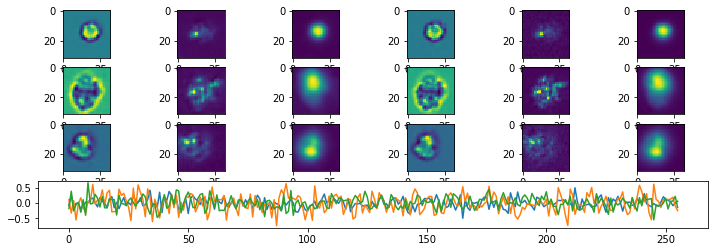

Iteration:  42100 Loss:  1.8978688 1.8978688 0.0
Test Loss 3.0981388
Iteration:  42200 Loss:  2.1737657 2.1737657 0.0
Test Loss 3.128078
Iteration:  42300 Loss:  1.9197303 1.9197303 0.0
Test Loss 3.0950162
Iteration:  42400 Loss:  1.9889102 1.9889102 0.0
Test Loss 3.1078672
Iteration:  42500 Loss:  2.069026 2.069026 0.0
Test Loss 3.1322834
Iteration:  42600 Loss:  2.036677 2.036677 0.0
Test Loss 3.104116
Iteration:  42700 Loss:  2.0345135 2.0345135 0.0
Test Loss 3.1131418
Iteration:  42800 Loss:  2.1773593 2.1773593 0.0
Test Loss 3.102248
Iteration:  42900 Loss:  1.9138534 1.9138534 0.0
Test Loss 3.0937495
Iteration:  43000 Loss:  2.0789967 2.0789967 0.0
Test Loss 3.118166
Iteration:  43000 Loss:  2.0789967 2.0789967 0.0
Test Loss 3.118166


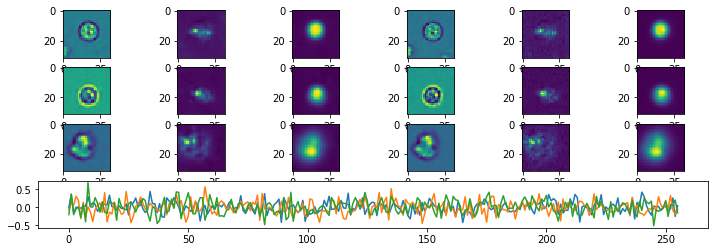

Iteration:  43100 Loss:  2.1119385 2.1119385 0.0
Test Loss 3.0984375
Iteration:  43200 Loss:  1.9867995 1.9867995 0.0
Test Loss 3.1036017
Iteration:  43300 Loss:  1.942378 1.942378 0.0
Test Loss 3.0986862
Iteration:  43400 Loss:  1.9823829 1.9823829 0.0
Test Loss 3.1015062
Iteration:  43500 Loss:  1.9854572 1.9854572 0.0
Test Loss 3.1051717
Iteration:  43600 Loss:  1.9896 1.9896 0.0
Test Loss 3.0895243
Iteration:  43700 Loss:  2.1325588 2.1325588 0.0
Test Loss 3.0930746
Iteration:  43800 Loss:  1.9664664 1.9664664 0.0
Test Loss 3.0952916
Iteration:  43900 Loss:  2.1397333 2.1397333 0.0
Test Loss 3.118742
Iteration:  44000 Loss:  2.0517042 2.0517042 0.0
Test Loss 3.104919
Iteration:  44000 Loss:  2.0517042 2.0517042 0.0
Test Loss 3.104919


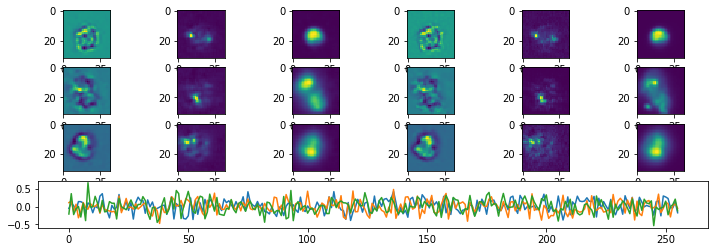

Iteration:  44100 Loss:  2.1537943 2.1537943 0.0
Test Loss 3.1127138
Iteration:  44200 Loss:  2.0851698 2.0851698 0.0
Test Loss 3.113609
Iteration:  44300 Loss:  2.1021097 2.1021097 0.0
Test Loss 3.1112695
Iteration:  44400 Loss:  1.9786491 1.9786491 0.0
Test Loss 3.0781045
Iteration:  44500 Loss:  2.0963037 2.0963037 0.0
Test Loss 3.1149971
Iteration:  44600 Loss:  1.9566146 1.9566146 0.0
Test Loss 3.1105947
Iteration:  44700 Loss:  1.9910787 1.9910787 0.0
Test Loss 3.0924387
Iteration:  44800 Loss:  1.919408 1.919408 0.0
Test Loss 3.102688
Iteration:  44900 Loss:  2.1944878 2.1944878 0.0
Test Loss 3.0957875
Iteration:  45000 Loss:  2.121581 2.121581 0.0
Test Loss 3.0920243
Iteration:  45000 Loss:  2.121581 2.121581 0.0
Test Loss 3.0920243


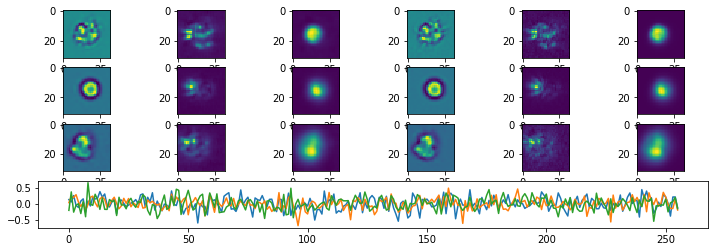

Iteration:  45100 Loss:  2.0259514 2.0259514 0.0
Test Loss 3.1039639
Iteration:  45200 Loss:  2.2208686 2.2208686 0.0
Test Loss 3.103917
Iteration:  45300 Loss:  2.052442 2.052442 0.0
Test Loss 3.1075907
Iteration:  45400 Loss:  2.2062862 2.2062862 0.0
Test Loss 3.1057444
Iteration:  45500 Loss:  2.0976434 2.0976434 0.0
Test Loss 3.1060767
Iteration:  45600 Loss:  2.088835 2.088835 0.0
Test Loss 3.1013482
Iteration:  45700 Loss:  2.0114305 2.0114305 0.0
Test Loss 3.113891
Iteration:  45800 Loss:  2.0101726 2.0101726 0.0
Test Loss 3.1129637
Iteration:  45900 Loss:  2.0152838 2.0152838 0.0
Test Loss 3.0912561
Iteration:  46000 Loss:  1.9583516 1.9583516 0.0
Test Loss 3.1040552
Iteration:  46000 Loss:  1.9583516 1.9583516 0.0
Test Loss 3.1040552


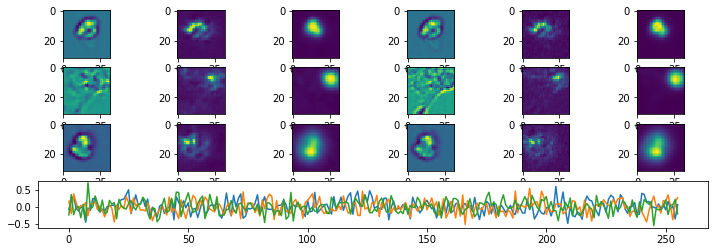

Iteration:  46100 Loss:  2.0148227 2.0148227 0.0
Test Loss 3.110105
Iteration:  46200 Loss:  1.9856944 1.9856944 0.0
Test Loss 3.1011462
Iteration:  46300 Loss:  1.9356822 1.9356822 0.0
Test Loss 3.0956302
Iteration:  46400 Loss:  2.0450778 2.0450778 0.0
Test Loss 3.0824208
Iteration:  46500 Loss:  2.011742 2.011742 0.0
Test Loss 3.1130838
Iteration:  46600 Loss:  1.8776201 1.8776201 0.0
Test Loss 3.0988107
Iteration:  46700 Loss:  1.9331354 1.9331354 0.0
Test Loss 3.1027427
Iteration:  46800 Loss:  2.0052867 2.0052867 0.0
Test Loss 3.086976
Iteration:  46900 Loss:  2.0998504 2.0998504 0.0
Test Loss 3.0969343
Iteration:  47000 Loss:  2.1438012 2.1438012 0.0
Test Loss 3.0819001
Iteration:  47000 Loss:  2.1438012 2.1438012 0.0
Test Loss 3.0819001


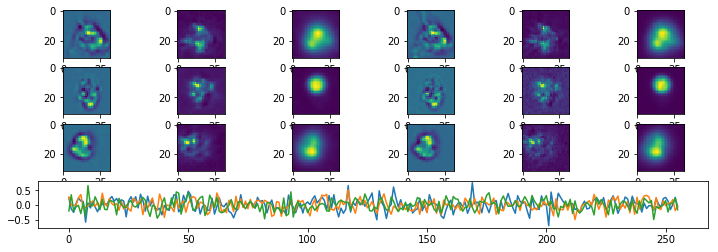

Iteration:  47100 Loss:  2.149318 2.149318 0.0
Test Loss 3.1079824
Iteration:  47200 Loss:  2.093333 2.093333 0.0
Test Loss 3.09764
Iteration:  47300 Loss:  1.9751211 1.9751211 0.0
Test Loss 3.1068213
Iteration:  47400 Loss:  2.1007786 2.1007786 0.0
Test Loss 3.0892653
Iteration:  47500 Loss:  2.1625152 2.1625152 0.0
Test Loss 3.0992873
Iteration:  47600 Loss:  2.1767673 2.1767673 0.0
Test Loss 3.1124651
Iteration:  47700 Loss:  1.8660085 1.8660085 0.0
Test Loss 3.0898838
Iteration:  47800 Loss:  1.9729651 1.9729651 0.0
Test Loss 3.1039228
Iteration:  47900 Loss:  2.1657724 2.1657724 0.0
Test Loss 3.1087902
Iteration:  48000 Loss:  1.9977973 1.9977973 0.0
Test Loss 3.0896268
Iteration:  48000 Loss:  1.9977973 1.9977973 0.0
Test Loss 3.0896268


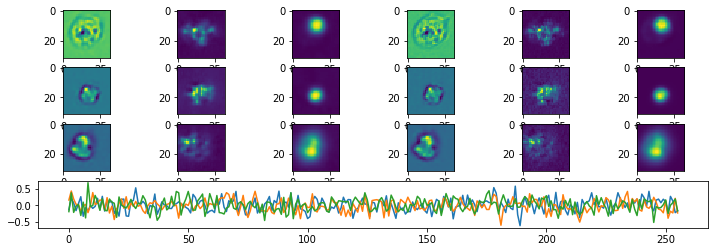

Iteration:  48100 Loss:  2.1570172 2.1570172 0.0
Test Loss 3.125988
Iteration:  48200 Loss:  2.0596824 2.0596824 0.0
Test Loss 3.1025434
Iteration:  48300 Loss:  1.9927156 1.9927156 0.0
Test Loss 3.0921938
Iteration:  48400 Loss:  1.958337 1.958337 0.0
Test Loss 3.1049066
Iteration:  48500 Loss:  1.9957724 1.9957724 0.0
Test Loss 3.106489
Iteration:  48600 Loss:  1.9888315 1.9888315 0.0
Test Loss 3.1021185
Iteration:  48700 Loss:  2.1491704 2.1491704 0.0
Test Loss 3.0971255
Iteration:  48800 Loss:  2.0108485 2.0108485 0.0
Test Loss 3.0886383
Iteration:  48900 Loss:  2.0268407 2.0268407 0.0
Test Loss 3.0974824
Iteration:  49000 Loss:  1.8230506 1.8230506 0.0
Test Loss 3.1072576
Iteration:  49000 Loss:  1.8230506 1.8230506 0.0
Test Loss 3.1072576


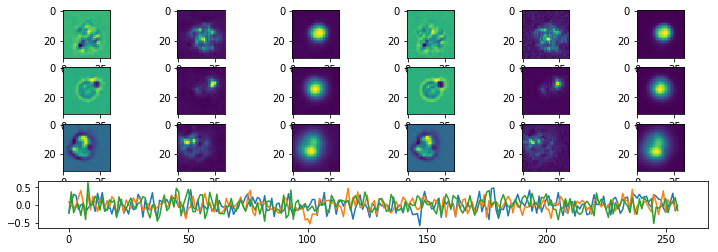

Iteration:  49100 Loss:  1.9414968 1.9414968 0.0
Test Loss 3.0980031
Iteration:  49200 Loss:  2.0734482 2.0734482 0.0
Test Loss 3.10051
Iteration:  49300 Loss:  2.058854 2.058854 0.0
Test Loss 3.0982847
Iteration:  49400 Loss:  2.0030324 2.0030324 0.0
Test Loss 3.1128511
Iteration:  49500 Loss:  2.084008 2.084008 0.0
Test Loss 3.0953503
Iteration:  49600 Loss:  1.9086514 1.9086514 0.0
Test Loss 3.0910585
Iteration:  49700 Loss:  1.9160426 1.9160426 0.0
Test Loss 3.1015015
Iteration:  49800 Loss:  1.8345106 1.8345106 0.0
Test Loss 3.098634
Iteration:  49900 Loss:  2.094781 2.094781 0.0
Test Loss 3.1294732
Iteration:  50000 Loss:  2.104591 2.104591 0.0
Test Loss 3.0972786
Iteration:  50000 Loss:  2.104591 2.104591 0.0
Test Loss 3.0972786


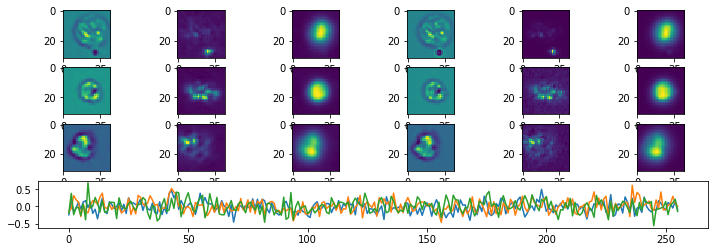

Iteration:  50100 Loss:  1.9691656 1.9691656 0.0
Test Loss 3.1016614
Iteration:  50200 Loss:  2.0209956 2.0209956 0.0
Test Loss 3.1041615
Iteration:  50300 Loss:  2.0440533 2.0440533 0.0
Test Loss 3.1053689
Iteration:  50400 Loss:  1.9958165 1.9958165 0.0
Test Loss 3.0946045
Iteration:  50500 Loss:  2.0741334 2.0741334 0.0
Test Loss 3.0998816
Iteration:  50600 Loss:  2.1532357 2.1532357 0.0
Test Loss 3.1358993
Iteration:  50700 Loss:  1.9820313 1.9820313 0.0
Test Loss 3.082308
Iteration:  50800 Loss:  2.1021662 2.1021662 0.0
Test Loss 3.093149
Iteration:  50900 Loss:  2.0955229 2.0955229 0.0
Test Loss 3.0896344
Iteration:  51000 Loss:  1.9258164 1.9258164 0.0
Test Loss 3.09123
Iteration:  51000 Loss:  1.9258164 1.9258164 0.0
Test Loss 3.09123


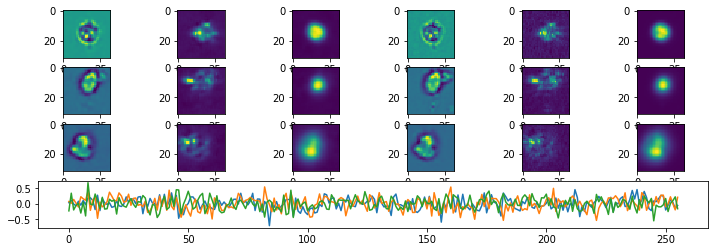

Iteration:  51100 Loss:  2.067082 2.067082 0.0
Test Loss 3.1099362
Iteration:  51200 Loss:  2.0012953 2.0012953 0.0
Test Loss 3.1087353
Iteration:  51300 Loss:  1.8890749 1.8890749 0.0
Test Loss 3.0949814
Iteration:  51400 Loss:  2.0519001 2.0519001 0.0
Test Loss 3.09205
Iteration:  51500 Loss:  1.9949839 1.9949839 0.0
Test Loss 3.0860066
Iteration:  51600 Loss:  1.9502145 1.9502145 0.0
Test Loss 3.0855882
Iteration:  51700 Loss:  2.0798497 2.0798497 0.0
Test Loss 3.097485
Iteration:  51800 Loss:  1.9578633 1.9578633 0.0
Test Loss 3.1295867
Iteration:  51900 Loss:  2.0925453 2.0925453 0.0
Test Loss 3.119205
Iteration:  52000 Loss:  1.9271352 1.9271352 0.0
Test Loss 3.0943623
Iteration:  52000 Loss:  1.9271352 1.9271352 0.0
Test Loss 3.0943623


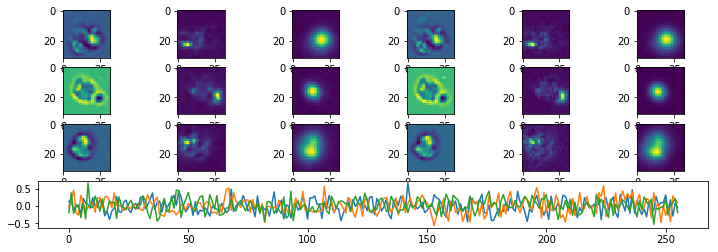

Iteration:  52100 Loss:  1.9455084 1.9455084 0.0
Test Loss 3.0903215
Iteration:  52200 Loss:  1.9335183 1.9335183 0.0
Test Loss 3.094751
Iteration:  52300 Loss:  2.0683439 2.0683439 0.0
Test Loss 3.1098013
Iteration:  52400 Loss:  1.8496257 1.8496257 0.0
Test Loss 3.110056
Iteration:  52500 Loss:  1.9370544 1.9370544 0.0
Test Loss 3.1076856
Iteration:  52600 Loss:  1.9192189 1.9192189 0.0
Test Loss 3.0920455
Iteration:  52700 Loss:  1.9993138 1.9993138 0.0
Test Loss 3.1088567
Iteration:  52800 Loss:  1.911166 1.911166 0.0
Test Loss 3.1010914
Iteration:  52900 Loss:  2.0518177 2.0518177 0.0
Test Loss 3.1091619
Iteration:  53000 Loss:  1.9677463 1.9677463 0.0
Test Loss 3.0872643
Iteration:  53000 Loss:  1.9677463 1.9677463 0.0
Test Loss 3.0872643


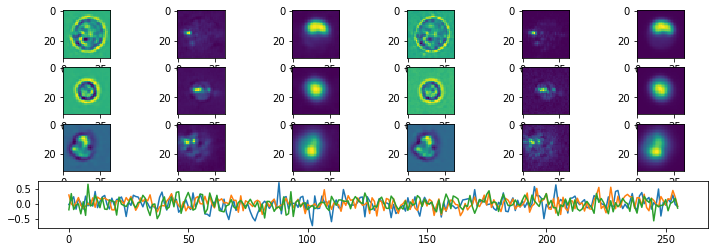

Iteration:  53100 Loss:  1.7665699 1.7665699 0.0
Test Loss 3.1031024
Iteration:  53200 Loss:  2.0232706 2.0232706 0.0
Test Loss 3.0963285
Iteration:  53300 Loss:  1.9449167 1.9449167 0.0
Test Loss 3.121878
Iteration:  53400 Loss:  2.127417 2.127417 0.0
Test Loss 3.08784
Iteration:  53500 Loss:  2.0156739 2.0156739 0.0
Test Loss 3.0995464
Iteration:  53600 Loss:  1.8362056 1.8362056 0.0
Test Loss 3.0916073
Iteration:  53700 Loss:  1.9039633 1.9039633 0.0
Test Loss 3.1012769
Iteration:  53800 Loss:  1.920855 1.920855 0.0
Test Loss 3.1156464
Iteration:  53900 Loss:  2.0601604 2.0601604 0.0
Test Loss 3.0891767
Iteration:  54000 Loss:  1.964716 1.964716 0.0
Test Loss 3.0849957
Iteration:  54000 Loss:  1.964716 1.964716 0.0
Test Loss 3.0849957


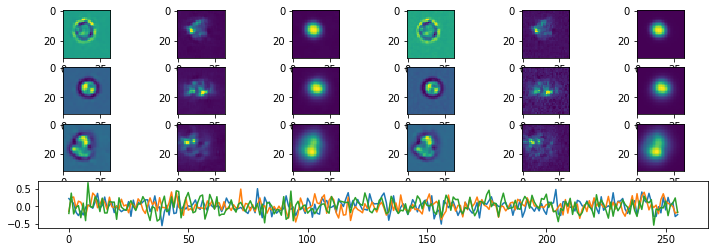

Iteration:  54100 Loss:  1.9030001 1.9030001 0.0
Test Loss 3.0913708
Iteration:  54200 Loss:  1.9901845 1.9901845 0.0
Test Loss 3.096742
Iteration:  54300 Loss:  1.9827808 1.9827808 0.0
Test Loss 3.088958
Iteration:  54400 Loss:  1.9471519 1.9471519 0.0
Test Loss 3.0855558
Iteration:  54500 Loss:  1.935697 1.935697 0.0
Test Loss 3.0835428
Iteration:  54600 Loss:  2.084154 2.084154 0.0
Test Loss 3.0937803
Iteration:  54700 Loss:  1.8392059 1.8392059 0.0
Test Loss 3.1003897
Iteration:  54800 Loss:  2.050778 2.050778 0.0
Test Loss 3.0947707
Iteration:  54900 Loss:  2.0648246 2.0648246 0.0
Test Loss 3.0953286
Iteration:  55000 Loss:  1.9822387 1.9822387 0.0
Test Loss 3.1140118
Iteration:  55000 Loss:  1.9822387 1.9822387 0.0
Test Loss 3.1140118


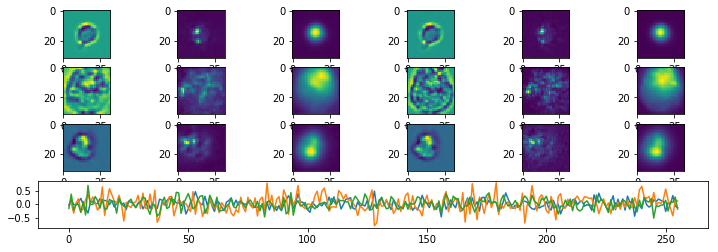

Iteration:  55100 Loss:  1.9171487 1.9171487 0.0
Test Loss 3.0866373
Iteration:  55200 Loss:  1.9397748 1.9397748 0.0
Test Loss 3.1244712
Iteration:  55300 Loss:  1.8535781 1.8535781 0.0
Test Loss 3.0846765
Iteration:  55400 Loss:  1.915277 1.915277 0.0
Test Loss 3.098664
Iteration:  55500 Loss:  1.8747387 1.8747387 0.0
Test Loss 3.1074064
Iteration:  55600 Loss:  2.001967 2.001967 0.0
Test Loss 3.1003075
Iteration:  55700 Loss:  1.9322877 1.9322877 0.0
Test Loss 3.1026015
Iteration:  55800 Loss:  2.0872784 2.0872784 0.0
Test Loss 3.11448
Iteration:  55900 Loss:  1.9049835 1.9049835 0.0
Test Loss 3.1083283
Iteration:  56000 Loss:  2.0247262 2.0247262 0.0
Test Loss 3.095764
Iteration:  56000 Loss:  2.0247262 2.0247262 0.0
Test Loss 3.095764


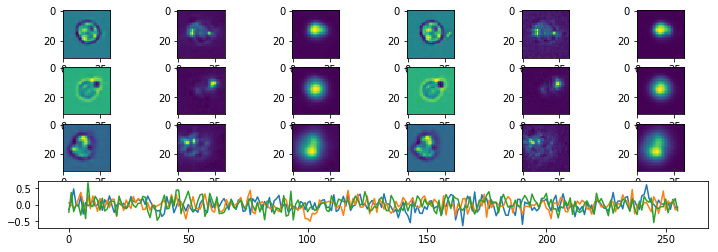

Iteration:  56100 Loss:  2.0620763 2.0620763 0.0
Test Loss 3.1022413
Iteration:  56200 Loss:  1.996011 1.996011 0.0
Test Loss 3.104309
Iteration:  56300 Loss:  1.9925513 1.9925513 0.0
Test Loss 3.1139002
Iteration:  56400 Loss:  1.8990564 1.8990564 0.0
Test Loss 3.1044302
Iteration:  56500 Loss:  1.8443341 1.8443341 0.0
Test Loss 3.088539
Iteration:  56600 Loss:  1.9334611 1.9334611 0.0
Test Loss 3.088324
Iteration:  56700 Loss:  2.0559998 2.0559998 0.0
Test Loss 3.0930493
Iteration:  56800 Loss:  2.0352025 2.0352025 0.0
Test Loss 3.0903606
Iteration:  56900 Loss:  2.0429168 2.0429168 0.0
Test Loss 3.1154788
Iteration:  57000 Loss:  2.0344863 2.0344863 0.0
Test Loss 3.0985959
Iteration:  57000 Loss:  2.0344863 2.0344863 0.0
Test Loss 3.0985959


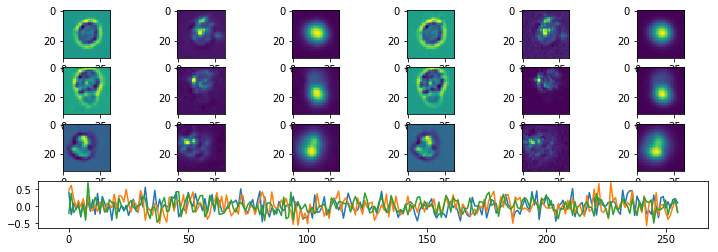

Iteration:  57100 Loss:  1.9574263 1.9574263 0.0
Test Loss 3.0957584
Iteration:  57200 Loss:  1.8851272 1.8851272 0.0
Test Loss 3.0947762
Iteration:  57300 Loss:  1.9024792 1.9024792 0.0
Test Loss 3.0957327
Iteration:  57400 Loss:  1.9169745 1.9169745 0.0
Test Loss 3.1005635
Iteration:  57500 Loss:  1.817595 1.817595 0.0
Test Loss 3.0944343
Iteration:  57600 Loss:  2.021563 2.021563 0.0
Test Loss 3.1038806
Iteration:  57700 Loss:  1.9341226 1.9341226 0.0
Test Loss 3.1022751
Iteration:  57800 Loss:  1.8331857 1.8331857 0.0
Test Loss 3.0939317
Iteration:  57900 Loss:  1.8581517 1.8581517 0.0
Test Loss 3.0951412
Iteration:  58000 Loss:  1.964901 1.964901 0.0
Test Loss 3.093884
Iteration:  58000 Loss:  1.964901 1.964901 0.0
Test Loss 3.093884


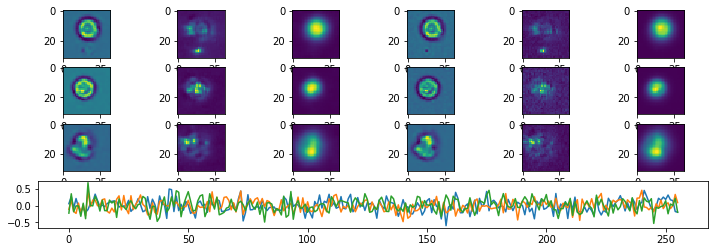

Iteration:  58100 Loss:  1.9402494 1.9402494 0.0
Test Loss 3.0962954
Iteration:  58200 Loss:  2.0809593 2.0809593 0.0
Test Loss 3.1168077
Iteration:  58300 Loss:  1.9926584 1.9926584 0.0
Test Loss 3.0986989
Iteration:  58400 Loss:  1.9975785 1.9975785 0.0
Test Loss 3.0967674
Iteration:  58500 Loss:  2.0121088 2.0121088 0.0
Test Loss 3.092902
Iteration:  58600 Loss:  2.0001538 2.0001538 0.0
Test Loss 3.085836
Iteration:  58700 Loss:  1.8540301 1.8540301 0.0
Test Loss 3.095572
Iteration:  58800 Loss:  1.8424816 1.8424816 0.0
Test Loss 3.088864
Iteration:  58900 Loss:  2.077238 2.077238 0.0
Test Loss 3.1118011
Iteration:  59000 Loss:  2.0438643 2.0438643 0.0
Test Loss 3.10986
Iteration:  59000 Loss:  2.0438643 2.0438643 0.0
Test Loss 3.10986


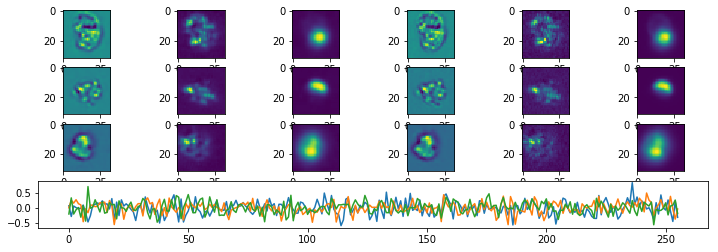

Iteration:  59100 Loss:  1.9192109 1.9192109 0.0
Test Loss 3.1028638
Iteration:  59200 Loss:  1.9009255 1.9009255 0.0
Test Loss 3.1131454
Iteration:  59300 Loss:  1.8359256 1.8359256 0.0
Test Loss 3.097832
Iteration:  59400 Loss:  1.9283396 1.9283396 0.0
Test Loss 3.0993629
Iteration:  59500 Loss:  2.0949988 2.0949988 0.0
Test Loss 3.1069176
Iteration:  59600 Loss:  1.7880964 1.7880964 0.0
Test Loss 3.1025267
Iteration:  59700 Loss:  2.067253 2.067253 0.0
Test Loss 3.1216104
Iteration:  59800 Loss:  1.8027499 1.8027499 0.0
Test Loss 3.0994864
Iteration:  59900 Loss:  1.8373222 1.8373222 0.0
Test Loss 3.0867276
Iteration:  60000 Loss:  1.8126577 1.8126577 0.0
Test Loss 3.081451
Iteration:  60000 Loss:  1.8126577 1.8126577 0.0
Test Loss 3.081451


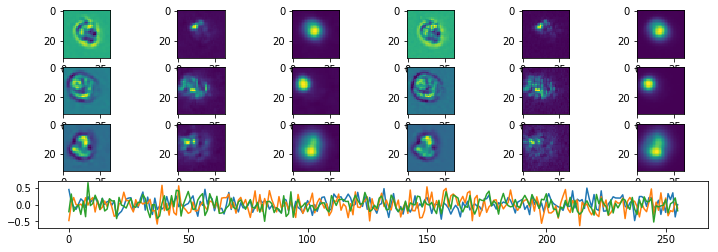

Iteration:  60100 Loss:  1.9657373 1.9657373 0.0
Test Loss 3.0843778
Iteration:  60200 Loss:  2.0379128 2.0379128 0.0
Test Loss 3.1006892
Iteration:  60300 Loss:  1.9457088 1.9457088 0.0
Test Loss 3.1019528
Iteration:  60400 Loss:  2.008961 2.008961 0.0
Test Loss 3.108049
Iteration:  60500 Loss:  1.9037535 1.9037535 0.0
Test Loss 3.1269345
Iteration:  60600 Loss:  2.0195873 2.0195873 0.0
Test Loss 3.0974765
Iteration:  60700 Loss:  1.866644 1.866644 0.0
Test Loss 3.0978498
Iteration:  60800 Loss:  1.8218412 1.8218412 0.0
Test Loss 3.096364
Iteration:  60900 Loss:  1.8610469 1.8610469 0.0
Test Loss 3.1073217
Iteration:  61000 Loss:  1.9548651 1.9548651 0.0
Test Loss 3.0935466
Iteration:  61000 Loss:  1.9548651 1.9548651 0.0
Test Loss 3.0935466


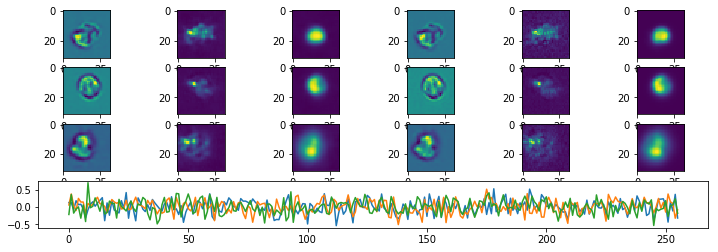

Iteration:  61100 Loss:  1.8936713 1.8936713 0.0
Test Loss 3.0904408
Iteration:  61200 Loss:  1.8636888 1.8636888 0.0
Test Loss 3.1100116
Iteration:  61300 Loss:  1.9605575 1.9605575 0.0
Test Loss 3.1018283
Iteration:  61400 Loss:  1.9078722 1.9078722 0.0
Test Loss 3.1024342
Iteration:  61500 Loss:  1.9812593 1.9812593 0.0
Test Loss 3.0951064
Iteration:  61600 Loss:  1.8005792 1.8005792 0.0
Test Loss 3.109312
Iteration:  61700 Loss:  1.9054358 1.9054358 0.0
Test Loss 3.1029332
Iteration:  61800 Loss:  1.8541465 1.8541465 0.0
Test Loss 3.0983486
Iteration:  61900 Loss:  1.9892856 1.9892856 0.0
Test Loss 3.1236858
Iteration:  62000 Loss:  1.8838581 1.8838581 0.0
Test Loss 3.0902712
Iteration:  62000 Loss:  1.8838581 1.8838581 0.0
Test Loss 3.0902712


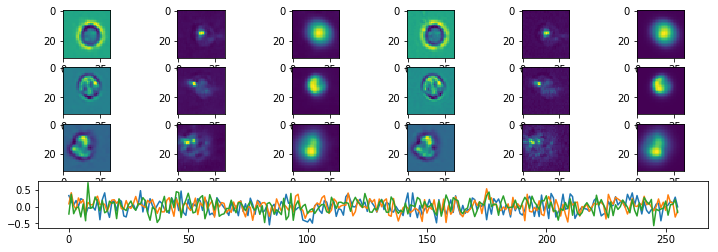

Iteration:  62100 Loss:  1.9581083 1.9581083 0.0
Test Loss 3.1085749
Iteration:  62200 Loss:  1.8490434 1.8490434 0.0
Test Loss 3.1053782
Iteration:  62300 Loss:  1.9639001 1.9639001 0.0
Test Loss 3.095576
Iteration:  62400 Loss:  1.8115122 1.8115122 0.0
Test Loss 3.0957801
Iteration:  62500 Loss:  1.9884986 1.9884986 0.0
Test Loss 3.1082435
Iteration:  62600 Loss:  1.8826131 1.8826131 0.0
Test Loss 3.102623
Iteration:  62700 Loss:  1.9648044 1.9648044 0.0
Test Loss 3.1011903
Iteration:  62800 Loss:  1.8963561 1.8963561 0.0
Test Loss 3.098729
Iteration:  62900 Loss:  1.7337319 1.7337319 0.0
Test Loss 3.1100354
Iteration:  63000 Loss:  1.9323312 1.9323312 0.0
Test Loss 3.0997083
Iteration:  63000 Loss:  1.9323312 1.9323312 0.0
Test Loss 3.0997083


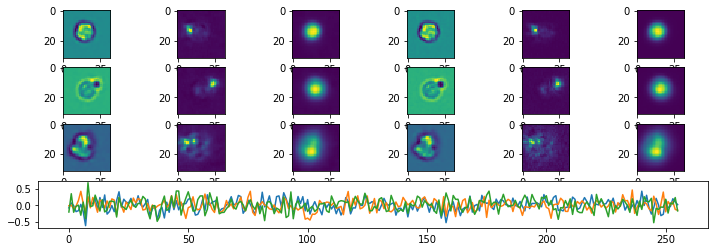

Iteration:  63100 Loss:  1.9440768 1.9440768 0.0
Test Loss 3.125591
Iteration:  63200 Loss:  1.8564906 1.8564906 0.0
Test Loss 3.0905828
Iteration:  63300 Loss:  1.9451158 1.9451158 0.0
Test Loss 3.0897746
Iteration:  63400 Loss:  1.8088806 1.8088806 0.0
Test Loss 3.1028767
Iteration:  63500 Loss:  1.8076106 1.8076106 0.0
Test Loss 3.1033895
Iteration:  63600 Loss:  2.0104723 2.0104723 0.0
Test Loss 3.1374145
Iteration:  63700 Loss:  2.0005434 2.0005434 0.0
Test Loss 3.092599
Iteration:  63800 Loss:  1.9114797 1.9114797 0.0
Test Loss 3.093637
Iteration:  63900 Loss:  1.969765 1.969765 0.0
Test Loss 3.1067672
Iteration:  64000 Loss:  1.8415835 1.8415835 0.0
Test Loss 3.0943298
Iteration:  64000 Loss:  1.8415835 1.8415835 0.0
Test Loss 3.0943298


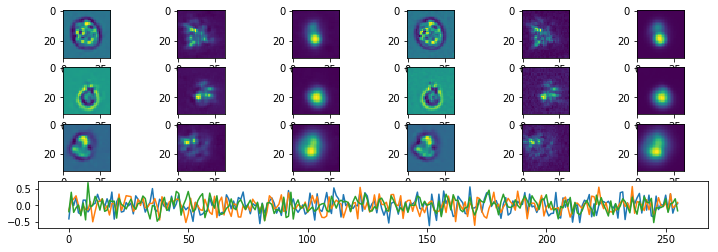

Iteration:  64100 Loss:  2.0583196 2.0583196 0.0
Test Loss 3.1012962
Iteration:  64200 Loss:  2.0408695 2.0408695 0.0
Test Loss 3.1138513
Iteration:  64300 Loss:  1.8849633 1.8849633 0.0
Test Loss 3.1088607
Iteration:  64400 Loss:  1.8954407 1.8954407 0.0
Test Loss 3.0896995
Iteration:  64500 Loss:  1.9391279 1.9391279 0.0
Test Loss 3.1126463
Iteration:  64600 Loss:  1.958949 1.958949 0.0
Test Loss 3.104048
Iteration:  64700 Loss:  1.7997096 1.7997096 0.0
Test Loss 3.1097724
Iteration:  64800 Loss:  1.971349 1.971349 0.0
Test Loss 3.1188133
Iteration:  64900 Loss:  1.9083579 1.9083579 0.0
Test Loss 3.0937724
Iteration:  65000 Loss:  2.0338218 2.0338218 0.0
Test Loss 3.1028533
Iteration:  65000 Loss:  2.0338218 2.0338218 0.0
Test Loss 3.1028533


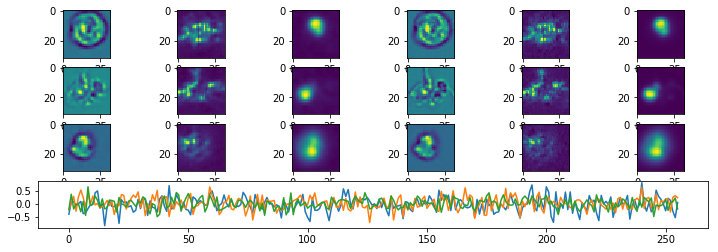

Iteration:  65100 Loss:  1.7364916 1.7364916 0.0
Test Loss 3.1005106
Iteration:  65200 Loss:  1.9505464 1.9505464 0.0
Test Loss 3.1100423
Iteration:  65300 Loss:  2.0394597 2.0394597 0.0
Test Loss 3.1070588
Iteration:  65400 Loss:  2.0127258 2.0127258 0.0
Test Loss 3.1130962
Iteration:  65500 Loss:  1.83036 1.83036 0.0
Test Loss 3.0974617
Iteration:  65600 Loss:  1.7179636 1.7179636 0.0
Test Loss 3.0964117
Iteration:  65700 Loss:  1.9985384 1.9985384 0.0
Test Loss 3.1096733
Iteration:  65800 Loss:  1.9038908 1.9038908 0.0
Test Loss 3.0972705
Iteration:  65900 Loss:  1.9553585 1.9553585 0.0
Test Loss 3.1001713
Iteration:  66000 Loss:  1.8434893 1.8434893 0.0
Test Loss 3.1258183
Iteration:  66000 Loss:  1.8434893 1.8434893 0.0
Test Loss 3.1258183


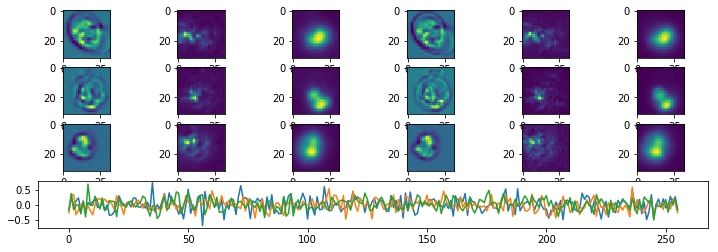

Iteration:  66100 Loss:  1.8707228 1.8707228 0.0
Test Loss 3.093853
Iteration:  66200 Loss:  1.8497931 1.8497931 0.0
Test Loss 3.119051
Iteration:  66300 Loss:  1.9152788 1.9152788 0.0
Test Loss 3.1069655
Iteration:  66400 Loss:  1.8891777 1.8891777 0.0
Test Loss 3.0958784
Iteration:  66500 Loss:  1.7625264 1.7625264 0.0
Test Loss 3.1043568
Iteration:  66600 Loss:  1.7991993 1.7991993 0.0
Test Loss 3.0976748
Iteration:  66700 Loss:  1.8799399 1.8799399 0.0
Test Loss 3.1039886
Iteration:  66800 Loss:  2.0223613 2.0223613 0.0
Test Loss 3.1140914
Iteration:  66900 Loss:  1.9659144 1.9659144 0.0
Test Loss 3.112021
Iteration:  67000 Loss:  1.9309565 1.9309565 0.0
Test Loss 3.099465
Iteration:  67000 Loss:  1.9309565 1.9309565 0.0
Test Loss 3.099465


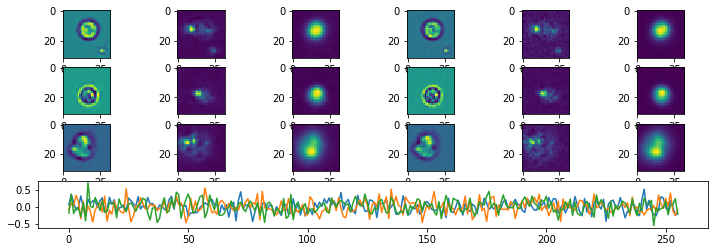

Iteration:  67100 Loss:  2.0190306 2.0190306 0.0
Test Loss 3.1090593
Iteration:  67200 Loss:  1.7946663 1.7946663 0.0
Test Loss 3.1079426
Iteration:  67300 Loss:  1.9090447 1.9090447 0.0
Test Loss 3.122229
Iteration:  67400 Loss:  1.935642 1.935642 0.0
Test Loss 3.1125298
Iteration:  67500 Loss:  1.9830179 1.9830179 0.0
Test Loss 3.1018682
Iteration:  67600 Loss:  1.8419948 1.8419948 0.0
Test Loss 3.107344
Iteration:  67700 Loss:  1.980138 1.980138 0.0
Test Loss 3.105234
Iteration:  67800 Loss:  1.944449 1.944449 0.0
Test Loss 3.1364942
Iteration:  67900 Loss:  1.9150088 1.9150088 0.0
Test Loss 3.0871673
Iteration:  68000 Loss:  1.8157067 1.8157067 0.0
Test Loss 3.1022186
Iteration:  68000 Loss:  1.8157067 1.8157067 0.0
Test Loss 3.1022186


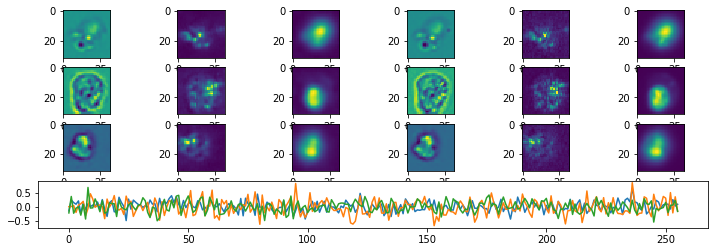

Iteration:  68100 Loss:  1.949576 1.949576 0.0
Test Loss 3.1072593
Iteration:  68200 Loss:  1.8427252 1.8427252 0.0
Test Loss 3.0986054
Iteration:  68300 Loss:  1.9273965 1.9273965 0.0
Test Loss 3.0838819
Iteration:  68400 Loss:  1.8490803 1.8490803 0.0
Test Loss 3.1160223
Iteration:  68500 Loss:  1.96548 1.96548 0.0
Test Loss 3.099525
Iteration:  68600 Loss:  1.9443395 1.9443395 0.0
Test Loss 3.115937
Iteration:  68700 Loss:  2.103684 2.103684 0.0
Test Loss 3.091663
Iteration:  68800 Loss:  1.9090087 1.9090087 0.0
Test Loss 3.108702
Iteration:  68900 Loss:  1.9142858 1.9142858 0.0
Test Loss 3.0918317
Iteration:  69000 Loss:  1.839529 1.839529 0.0
Test Loss 3.1017463
Iteration:  69000 Loss:  1.839529 1.839529 0.0
Test Loss 3.1017463


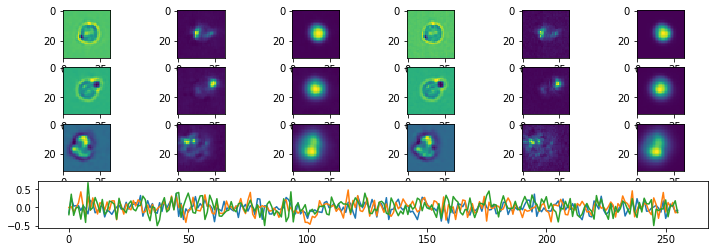

Iteration:  69100 Loss:  1.8475496 1.8475496 0.0
Test Loss 3.101236
Iteration:  69200 Loss:  1.8289077 1.8289077 0.0
Test Loss 3.1132543
Iteration:  69300 Loss:  1.7967247 1.7967247 0.0
Test Loss 3.1043587
Iteration:  69400 Loss:  1.8814629 1.8814629 0.0
Test Loss 3.0937343
Iteration:  69500 Loss:  1.7943077 1.7943077 0.0
Test Loss 3.1022234
Iteration:  69600 Loss:  1.9223856 1.9223856 0.0
Test Loss 3.0958476
Iteration:  69700 Loss:  1.9132696 1.9132696 0.0
Test Loss 3.1120763
Iteration:  69800 Loss:  1.8831264 1.8831264 0.0
Test Loss 3.1097217
Iteration:  69900 Loss:  1.8526309 1.8526309 0.0
Test Loss 3.1167748
Iteration:  70000 Loss:  1.8056965 1.8056965 0.0
Test Loss 3.0868106
Iteration:  70000 Loss:  1.8056965 1.8056965 0.0
Test Loss 3.0868106


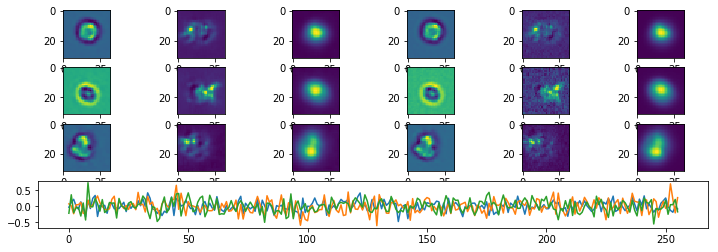

Iteration:  70100 Loss:  1.8266284 1.8266284 0.0
Test Loss 3.1130302
Iteration:  70200 Loss:  1.8784359 1.8784359 0.0
Test Loss 3.1051576
Iteration:  70300 Loss:  1.9080209 1.9080209 0.0
Test Loss 3.1156578
Iteration:  70400 Loss:  1.9506465 1.9506465 0.0
Test Loss 3.1172814
Iteration:  70500 Loss:  2.0017302 2.0017302 0.0
Test Loss 3.0998905
Iteration:  70600 Loss:  1.7589281 1.7589281 0.0
Test Loss 3.0916574
Iteration:  70700 Loss:  1.7686812 1.7686812 0.0
Test Loss 3.1063585
Iteration:  70800 Loss:  1.8603282 1.8603282 0.0
Test Loss 3.0950491
Iteration:  70900 Loss:  1.9627174 1.9627174 0.0
Test Loss 3.1072648
Iteration:  71000 Loss:  1.8732121 1.8732121 0.0
Test Loss 3.1044955
Iteration:  71000 Loss:  1.8732121 1.8732121 0.0
Test Loss 3.1044955


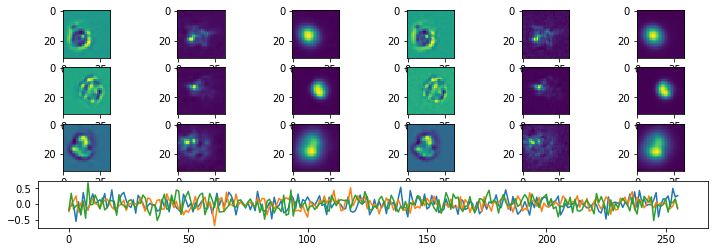

Iteration:  71100 Loss:  1.8985158 1.8985158 0.0
Test Loss 3.1095104
Iteration:  71200 Loss:  1.8408294 1.8408294 0.0
Test Loss 3.087648
Iteration:  71300 Loss:  1.960985 1.960985 0.0
Test Loss 3.1255908
Iteration:  71400 Loss:  1.9222082 1.9222082 0.0
Test Loss 3.1300228
Iteration:  71500 Loss:  1.8478105 1.8478105 0.0
Test Loss 3.1096463
Iteration:  71600 Loss:  1.9306726 1.9306726 0.0
Test Loss 3.0918386
Iteration:  71700 Loss:  1.7983834 1.7983834 0.0
Test Loss 3.1266704
Iteration:  71800 Loss:  1.7320216 1.7320216 0.0
Test Loss 3.0972772
Iteration:  71900 Loss:  1.8151863 1.8151863 0.0
Test Loss 3.0965884
Iteration:  72000 Loss:  1.8181784 1.8181784 0.0
Test Loss 3.1009228
Iteration:  72000 Loss:  1.8181784 1.8181784 0.0
Test Loss 3.1009228


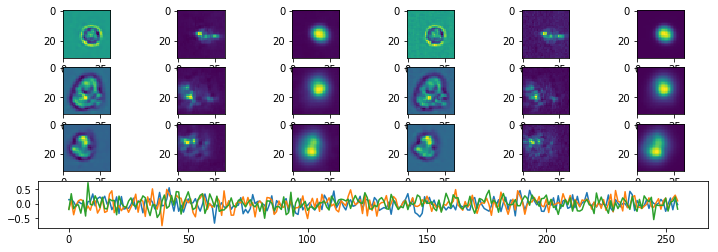

Iteration:  72100 Loss:  1.8201804 1.8201804 0.0
Test Loss 3.1086462
Iteration:  72200 Loss:  1.969634 1.969634 0.0
Test Loss 3.1305327
Iteration:  72300 Loss:  1.9446099 1.9446099 0.0
Test Loss 3.0968654
Iteration:  72400 Loss:  1.8406031 1.8406031 0.0
Test Loss 3.1276217
Iteration:  72500 Loss:  1.8666594 1.8666594 0.0
Test Loss 3.0950563
Iteration:  72600 Loss:  1.8366907 1.8366907 0.0
Test Loss 3.1186075
Iteration:  72700 Loss:  1.8673167 1.8673167 0.0
Test Loss 3.1011262
Iteration:  72800 Loss:  1.9929518 1.9929518 0.0
Test Loss 3.1116948
Iteration:  72900 Loss:  1.824524 1.824524 0.0
Test Loss 3.1008592
Iteration:  73000 Loss:  1.950746 1.950746 0.0
Test Loss 3.1006455
Iteration:  73000 Loss:  1.950746 1.950746 0.0
Test Loss 3.1006455


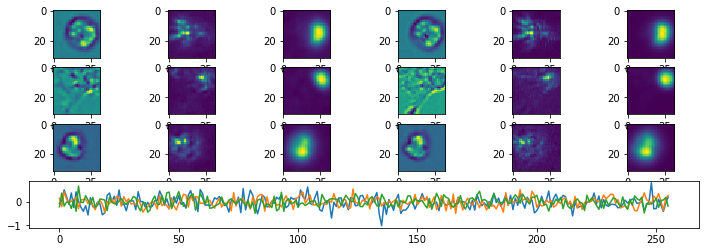

Iteration:  73100 Loss:  1.9444199 1.9444199 0.0
Test Loss 3.1050599
Iteration:  73200 Loss:  1.9880686 1.9880686 0.0
Test Loss 3.1147408
Iteration:  73300 Loss:  1.9574071 1.9574071 0.0
Test Loss 3.1145382
Iteration:  73400 Loss:  1.9397354 1.9397354 0.0
Test Loss 3.1035051
Iteration:  73500 Loss:  1.9538765 1.9538765 0.0
Test Loss 3.1281593
Iteration:  73600 Loss:  1.794878 1.794878 0.0
Test Loss 3.096971
Iteration:  73700 Loss:  1.8183211 1.8183211 0.0
Test Loss 3.1132653
Iteration:  73800 Loss:  1.9126631 1.9126631 0.0
Test Loss 3.10486
Iteration:  73900 Loss:  1.8596307 1.8596307 0.0
Test Loss 3.102611
Iteration:  74000 Loss:  1.7511191 1.7511191 0.0
Test Loss 3.112785
Iteration:  74000 Loss:  1.7511191 1.7511191 0.0
Test Loss 3.112785


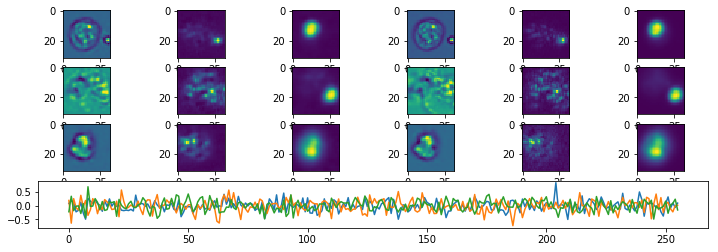

Iteration:  74100 Loss:  1.7503012 1.7503012 0.0
Test Loss 3.1076643
Iteration:  74200 Loss:  1.906756 1.906756 0.0
Test Loss 3.1115932
Iteration:  74300 Loss:  1.9004123 1.9004123 0.0
Test Loss 3.092514
Iteration:  74400 Loss:  1.9002736 1.9002736 0.0
Test Loss 3.1134624
Iteration:  74500 Loss:  2.0153403 2.0153403 0.0
Test Loss 3.109964
Iteration:  74600 Loss:  1.7514479 1.7514479 0.0
Test Loss 3.1204653
Iteration:  74700 Loss:  1.7471244 1.7471244 0.0
Test Loss 3.120729
Iteration:  74800 Loss:  1.8254188 1.8254188 0.0
Test Loss 3.10067
Iteration:  74900 Loss:  1.8800392 1.8800392 0.0
Test Loss 3.1246076
Iteration:  75000 Loss:  1.7758019 1.7758019 0.0
Test Loss 3.0966673
Iteration:  75000 Loss:  1.7758019 1.7758019 0.0
Test Loss 3.0966673


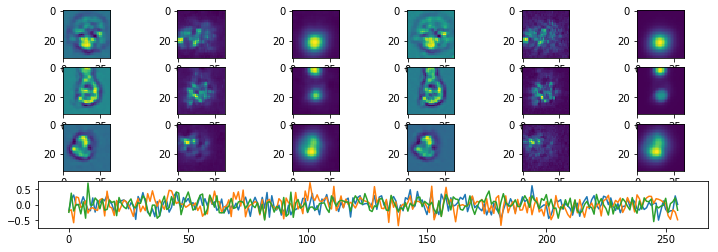

Iteration:  75100 Loss:  1.8755797 1.8755797 0.0
Test Loss 3.0998135
Iteration:  75200 Loss:  1.972743 1.972743 0.0
Test Loss 3.1002746
Iteration:  75300 Loss:  1.9164574 1.9164574 0.0
Test Loss 3.1146553
Iteration:  75400 Loss:  1.8591244 1.8591244 0.0
Test Loss 3.117641
Iteration:  75500 Loss:  1.9009384 1.9009384 0.0
Test Loss 3.106329
Iteration:  75600 Loss:  1.8375738 1.8375738 0.0
Test Loss 3.1271477
Iteration:  75700 Loss:  1.9777524 1.9777524 0.0
Test Loss 3.0961592
Iteration:  75800 Loss:  1.7297032 1.7297032 0.0
Test Loss 3.1025186
Iteration:  75900 Loss:  1.7823415 1.7823415 0.0
Test Loss 3.1078541
Iteration:  76000 Loss:  1.9279038 1.9279038 0.0
Test Loss 3.1046586
Iteration:  76000 Loss:  1.9279038 1.9279038 0.0
Test Loss 3.1046586


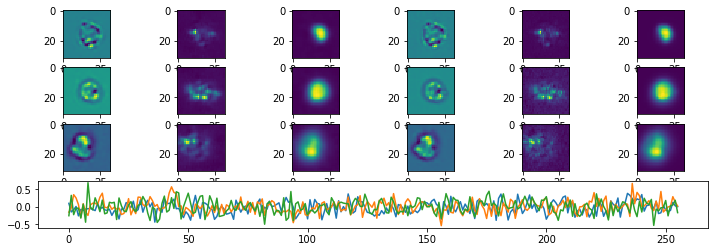

Iteration:  76100 Loss:  1.7592418 1.7592418 0.0
Test Loss 3.0963452
Iteration:  76200 Loss:  1.8857238 1.8857238 0.0
Test Loss 3.1204462
Iteration:  76300 Loss:  1.9479346 1.9479346 0.0
Test Loss 3.109053
Iteration:  76400 Loss:  2.003076 2.003076 0.0
Test Loss 3.1017559
Iteration:  76500 Loss:  1.7954158 1.7954158 0.0
Test Loss 3.1106372
Iteration:  76600 Loss:  1.8136545 1.8136545 0.0
Test Loss 3.117257
Iteration:  76700 Loss:  1.9190496 1.9190496 0.0
Test Loss 3.113153
Iteration:  76800 Loss:  1.9254837 1.9254837 0.0
Test Loss 3.1137357
Iteration:  76900 Loss:  1.9557557 1.9557557 0.0
Test Loss 3.1094644
Iteration:  77000 Loss:  1.9265848 1.9265848 0.0
Test Loss 3.097416
Iteration:  77000 Loss:  1.9265848 1.9265848 0.0
Test Loss 3.097416


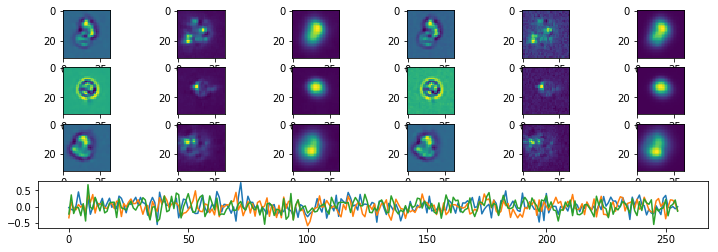

Iteration:  77100 Loss:  1.7425227 1.7425227 0.0
Test Loss 3.1119668
Iteration:  77200 Loss:  1.8592372 1.8592372 0.0
Test Loss 3.1148968
Iteration:  77300 Loss:  1.8790182 1.8790182 0.0
Test Loss 3.093773
Iteration:  77400 Loss:  1.8202937 1.8202937 0.0
Test Loss 3.110307
Iteration:  77500 Loss:  1.8782163 1.8782163 0.0
Test Loss 3.1191952
Iteration:  77600 Loss:  1.8670617 1.8670617 0.0
Test Loss 3.1087315
Iteration:  77700 Loss:  1.8404994 1.8404994 0.0
Test Loss 3.1530018
Iteration:  77800 Loss:  1.8488297 1.8488297 0.0
Test Loss 3.1109009
Iteration:  77900 Loss:  1.8135556 1.8135556 0.0
Test Loss 3.1090276
Iteration:  78000 Loss:  1.7821304 1.7821304 0.0
Test Loss 3.1173658
Iteration:  78000 Loss:  1.7821304 1.7821304 0.0
Test Loss 3.1173658


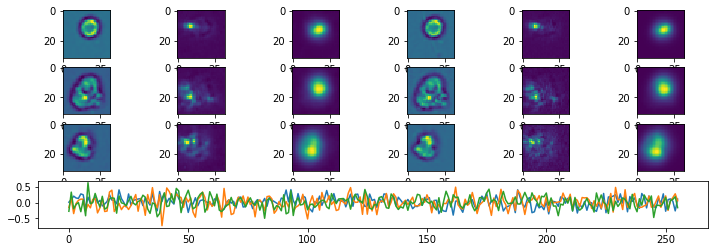

Iteration:  78100 Loss:  1.7899702 1.7899702 0.0
Test Loss 3.1183753
Iteration:  78200 Loss:  1.89536 1.89536 0.0
Test Loss 3.0993202
Iteration:  78300 Loss:  1.9288169 1.9288169 0.0
Test Loss 3.114911
Iteration:  78400 Loss:  1.7684817 1.7684817 0.0
Test Loss 3.1139302
Iteration:  78500 Loss:  1.8710808 1.8710808 0.0
Test Loss 3.1100945
Iteration:  78600 Loss:  1.8527853 1.8527853 0.0
Test Loss 3.123736
Iteration:  78700 Loss:  1.7355328 1.7355328 0.0
Test Loss 3.1065092
Iteration:  78800 Loss:  1.8296375 1.8296375 0.0
Test Loss 3.0893555
Iteration:  78900 Loss:  1.870451 1.870451 0.0
Test Loss 3.1138544
Iteration:  79000 Loss:  1.8134854 1.8134854 0.0
Test Loss 3.1052544
Iteration:  79000 Loss:  1.8134854 1.8134854 0.0
Test Loss 3.1052544


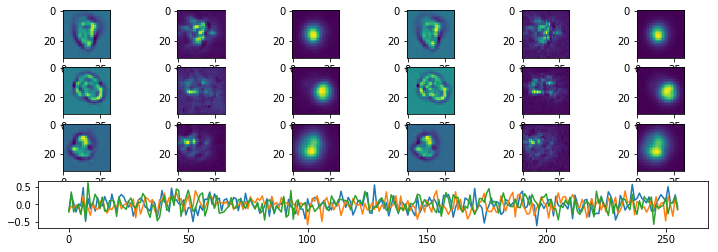

Iteration:  79100 Loss:  1.7549008 1.7549008 0.0
Test Loss 3.1102204
Iteration:  79200 Loss:  1.8586063 1.8586063 0.0
Test Loss 3.118672
Iteration:  79300 Loss:  1.9159184 1.9159184 0.0
Test Loss 3.117
Iteration:  79400 Loss:  1.7901162 1.7901162 0.0
Test Loss 3.1131475
Iteration:  79500 Loss:  1.8356313 1.8356313 0.0
Test Loss 3.1066556
Iteration:  79600 Loss:  1.8924797 1.8924797 0.0
Test Loss 3.1123402
Iteration:  79700 Loss:  1.7148077 1.7148077 0.0
Test Loss 3.1101933
Iteration:  79800 Loss:  1.8379922 1.8379922 0.0
Test Loss 3.1186283
Iteration:  79900 Loss:  1.8187875 1.8187875 0.0
Test Loss 3.100947
Iteration:  80000 Loss:  1.8194396 1.8194396 0.0
Test Loss 3.1078265
Iteration:  80000 Loss:  1.8194396 1.8194396 0.0
Test Loss 3.1078265


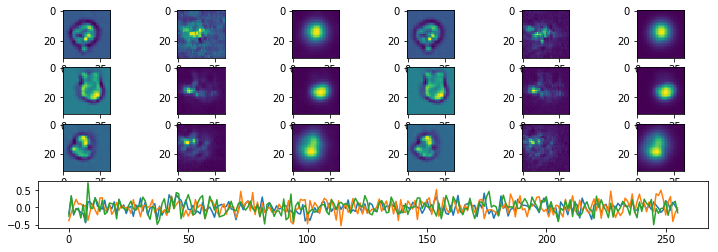

Iteration:  80100 Loss:  1.7282389 1.7282389 0.0
Test Loss 3.1333117
Iteration:  80200 Loss:  1.8768934 1.8768934 0.0
Test Loss 3.1201437
Iteration:  80300 Loss:  1.8297638 1.8297638 0.0
Test Loss 3.1173677
Iteration:  80400 Loss:  1.8339869 1.8339869 0.0
Test Loss 3.1073909
Iteration:  80500 Loss:  1.8563864 1.8563864 0.0
Test Loss 3.120137
Iteration:  80600 Loss:  1.8130919 1.8130919 0.0
Test Loss 3.1259341
Iteration:  80700 Loss:  1.8095422 1.8095422 0.0
Test Loss 3.1213846
Iteration:  80800 Loss:  1.8120539 1.8120539 0.0
Test Loss 3.1238465
Iteration:  80900 Loss:  1.8676107 1.8676107 0.0
Test Loss 3.1141226
Iteration:  81000 Loss:  1.8561051 1.8561051 0.0
Test Loss 3.124738
Iteration:  81000 Loss:  1.8561051 1.8561051 0.0
Test Loss 3.124738


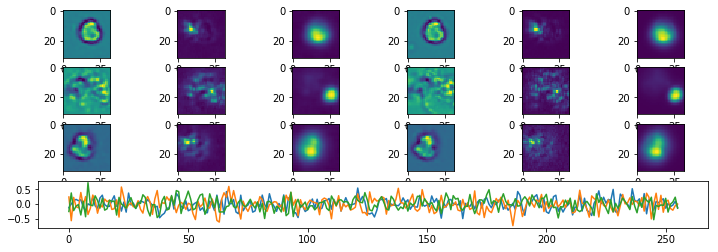

Iteration:  81100 Loss:  1.8641801 1.8641801 0.0
Test Loss 3.0924313
Iteration:  81200 Loss:  1.9921509 1.9921509 0.0
Test Loss 3.1065953
Iteration:  81300 Loss:  1.8746439 1.8746439 0.0
Test Loss 3.1218925
Iteration:  81400 Loss:  1.8807428 1.8807428 0.0
Test Loss 3.1164093
Iteration:  81500 Loss:  1.7930402 1.7930402 0.0
Test Loss 3.126452
Iteration:  81600 Loss:  1.9052995 1.9052995 0.0
Test Loss 3.0995474
Iteration:  81700 Loss:  1.8198955 1.8198955 0.0
Test Loss 3.1128073
Iteration:  81800 Loss:  1.8770859 1.8770859 0.0
Test Loss 3.1031506
Iteration:  81900 Loss:  1.9117444 1.9117444 0.0
Test Loss 3.1215181
Iteration:  82000 Loss:  1.9142883 1.9142883 0.0
Test Loss 3.1212728
Iteration:  82000 Loss:  1.9142883 1.9142883 0.0
Test Loss 3.1212728


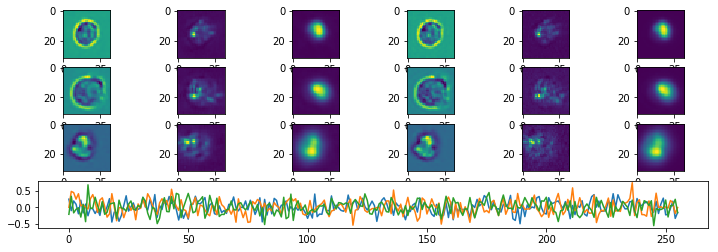

Iteration:  82100 Loss:  1.8811071 1.8811071 0.0
Test Loss 3.0995653
Iteration:  82200 Loss:  1.9419551 1.9419551 0.0
Test Loss 3.1247282
Iteration:  82300 Loss:  2.0001295 2.0001295 0.0
Test Loss 3.1198175
Iteration:  82400 Loss:  1.8390908 1.8390908 0.0
Test Loss 3.1018467
Iteration:  82500 Loss:  1.9367304 1.9367304 0.0
Test Loss 3.1073778
Iteration:  82600 Loss:  1.7247674 1.7247674 0.0
Test Loss 3.1040797
Iteration:  82700 Loss:  1.9638844 1.9638844 0.0
Test Loss 3.1277943
Iteration:  82800 Loss:  1.8553919 1.8553919 0.0
Test Loss 3.1008976
Iteration:  82900 Loss:  1.9253445 1.9253445 0.0
Test Loss 3.1301818
Iteration:  83000 Loss:  1.9249833 1.9249833 0.0
Test Loss 3.1240923
Iteration:  83000 Loss:  1.9249833 1.9249833 0.0
Test Loss 3.1240923


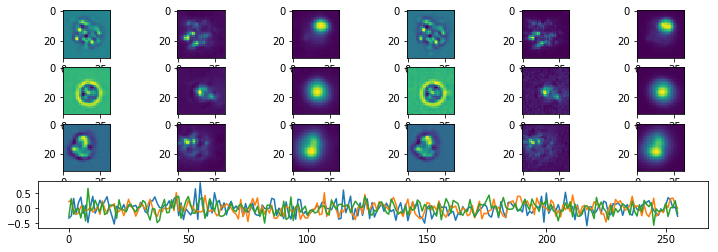

Iteration:  83100 Loss:  1.8416233 1.8416233 0.0
Test Loss 3.1184368
Iteration:  83200 Loss:  1.7948859 1.7948859 0.0
Test Loss 3.117549
Iteration:  83300 Loss:  1.796812 1.796812 0.0
Test Loss 3.1325438
Iteration:  83400 Loss:  1.851495 1.851495 0.0
Test Loss 3.103572
Iteration:  83500 Loss:  1.8615544 1.8615544 0.0
Test Loss 3.135046
Iteration:  83600 Loss:  1.7923295 1.7923295 0.0
Test Loss 3.1120095
Iteration:  83700 Loss:  2.0521693 2.0521693 0.0
Test Loss 3.1341643
Iteration:  83800 Loss:  1.8615973 1.8615973 0.0
Test Loss 3.1042492
Iteration:  83900 Loss:  1.9393522 1.9393522 0.0
Test Loss 3.1110263
Iteration:  84000 Loss:  1.8583407 1.8583407 0.0
Test Loss 3.1130617
Iteration:  84000 Loss:  1.8583407 1.8583407 0.0
Test Loss 3.1130617


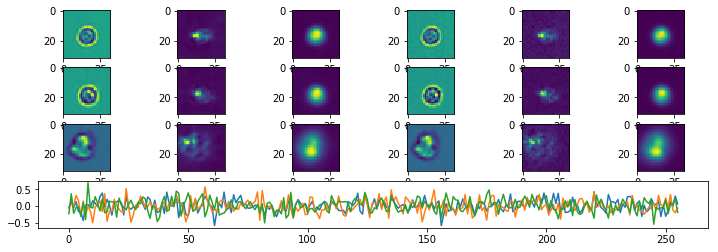

Iteration:  84100 Loss:  1.8289132 1.8289132 0.0
Test Loss 3.125313
Iteration:  84200 Loss:  1.8272074 1.8272074 0.0
Test Loss 3.1095116
Iteration:  84300 Loss:  1.808783 1.808783 0.0
Test Loss 3.1102824
Iteration:  84400 Loss:  1.8681815 1.8681815 0.0
Test Loss 3.1156752
Iteration:  84500 Loss:  1.9492669 1.9492669 0.0
Test Loss 3.1068115
Iteration:  84600 Loss:  1.7132108 1.7132108 0.0
Test Loss 3.1240604
Iteration:  84700 Loss:  1.914135 1.914135 0.0
Test Loss 3.1183686
Iteration:  84800 Loss:  1.8571485 1.8571485 0.0
Test Loss 3.1196725
Iteration:  84900 Loss:  1.8776064 1.8776064 0.0
Test Loss 3.1416602
Iteration:  85000 Loss:  1.876857 1.876857 0.0
Test Loss 3.1097906
Iteration:  85000 Loss:  1.876857 1.876857 0.0
Test Loss 3.1097906


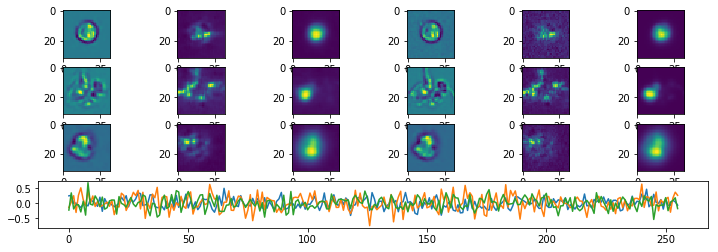

Iteration:  85100 Loss:  1.8529775 1.8529775 0.0
Test Loss 3.1132376
Iteration:  85200 Loss:  2.0097957 2.0097957 0.0
Test Loss 3.1471949
Iteration:  85300 Loss:  1.9367704 1.9367704 0.0
Test Loss 3.1259508
Iteration:  85400 Loss:  1.8890918 1.8890918 0.0
Test Loss 3.117567
Iteration:  85500 Loss:  1.8496214 1.8496214 0.0
Test Loss 3.1227498
Iteration:  85600 Loss:  1.8175343 1.8175343 0.0
Test Loss 3.1661727
Iteration:  85700 Loss:  2.0080464 2.0080464 0.0
Test Loss 3.1180463
Iteration:  85800 Loss:  1.8406574 1.8406574 0.0
Test Loss 3.1234808
Iteration:  85900 Loss:  1.9038547 1.9038547 0.0
Test Loss 3.112834
Iteration:  86000 Loss:  1.6687863 1.6687863 0.0
Test Loss 3.1299462
Iteration:  86000 Loss:  1.6687863 1.6687863 0.0
Test Loss 3.1299462


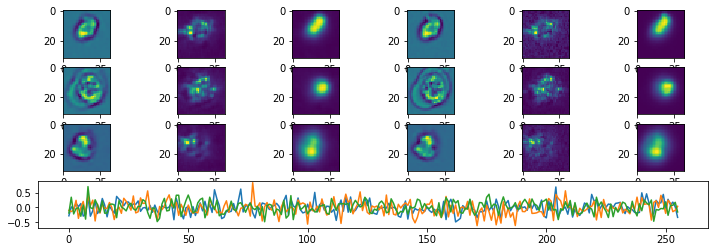

Iteration:  86100 Loss:  1.8253672 1.8253672 0.0
Test Loss 3.1095438
Iteration:  86200 Loss:  1.8743124 1.8743124 0.0
Test Loss 3.1370854
Iteration:  86300 Loss:  1.9234713 1.9234713 0.0
Test Loss 3.1241481
Iteration:  86400 Loss:  1.7238313 1.7238313 0.0
Test Loss 3.1035962
Iteration:  86500 Loss:  1.6496679 1.6496679 0.0
Test Loss 3.1071713
Iteration:  86600 Loss:  1.8403883 1.8403883 0.0
Test Loss 3.125196
Iteration:  86700 Loss:  1.8500715 1.8500715 0.0
Test Loss 3.1225362
Iteration:  86800 Loss:  1.8740647 1.8740647 0.0
Test Loss 3.109513
Iteration:  86900 Loss:  1.8568795 1.8568795 0.0
Test Loss 3.1342964
Iteration:  87000 Loss:  1.7368906 1.7368906 0.0
Test Loss 3.1211767
Iteration:  87000 Loss:  1.7368906 1.7368906 0.0
Test Loss 3.1211767


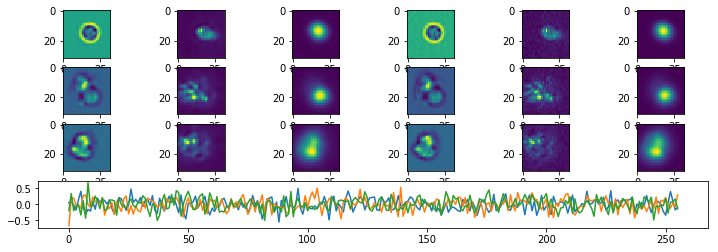

Iteration:  87100 Loss:  1.8905578 1.8905578 0.0
Test Loss 3.1239529
Iteration:  87200 Loss:  1.8815477 1.8815477 0.0
Test Loss 3.1044967
Iteration:  87300 Loss:  1.7912563 1.7912563 0.0
Test Loss 3.1074286
Iteration:  87400 Loss:  1.8726779 1.8726779 0.0
Test Loss 3.1194553
Iteration:  87500 Loss:  1.8922741 1.8922741 0.0
Test Loss 3.098758
Iteration:  87600 Loss:  1.7533233 1.7533233 0.0
Test Loss 3.114668
Iteration:  87700 Loss:  1.666997 1.666997 0.0
Test Loss 3.0858486
Iteration:  87800 Loss:  1.7094252 1.7094252 0.0
Test Loss 3.1153808
Iteration:  87900 Loss:  1.9040378 1.9040378 0.0
Test Loss 3.1056428
Iteration:  88000 Loss:  1.7707577 1.7707577 0.0
Test Loss 3.1516163
Iteration:  88000 Loss:  1.7707577 1.7707577 0.0
Test Loss 3.1516163


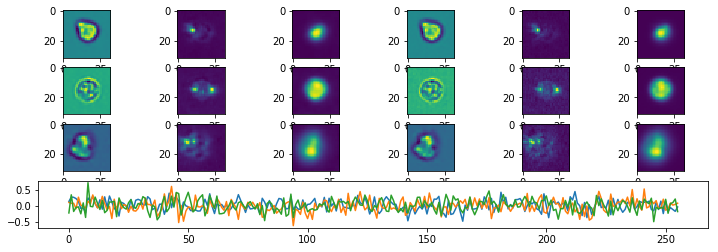

Iteration:  88100 Loss:  1.8440149 1.8440149 0.0
Test Loss 3.1447487
Iteration:  88200 Loss:  1.8120704 1.8120704 0.0
Test Loss 3.110609
Iteration:  88300 Loss:  1.8189492 1.8189492 0.0
Test Loss 3.1127672
Iteration:  88400 Loss:  1.7735968 1.7735968 0.0
Test Loss 3.1216617
Iteration:  88500 Loss:  1.7993912 1.7993912 0.0
Test Loss 3.13865
Iteration:  88600 Loss:  1.9049139 1.9049139 0.0
Test Loss 3.111886
Iteration:  88700 Loss:  1.6869438 1.6869438 0.0
Test Loss 3.1246498
Iteration:  88800 Loss:  1.8958035 1.8958035 0.0
Test Loss 3.1058245
Iteration:  88900 Loss:  1.9223785 1.9223785 0.0
Test Loss 3.1306086
Iteration:  89000 Loss:  1.7963321 1.7963321 0.0
Test Loss 3.1129546
Iteration:  89000 Loss:  1.7963321 1.7963321 0.0
Test Loss 3.1129546


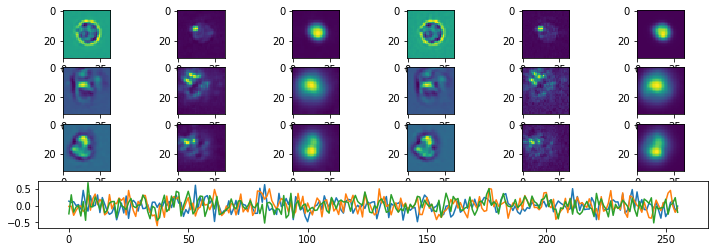

Iteration:  89100 Loss:  1.8349998 1.8349998 0.0
Test Loss 3.1168704
Iteration:  89200 Loss:  2.0315652 2.0315652 0.0
Test Loss 3.1263795
Iteration:  89300 Loss:  1.9085884 1.9085884 0.0
Test Loss 3.1340907
Iteration:  89400 Loss:  1.7634495 1.7634495 0.0
Test Loss 3.1109872
Iteration:  89500 Loss:  1.8428766 1.8428766 0.0
Test Loss 3.11371
Iteration:  89600 Loss:  1.8301153 1.8301153 0.0
Test Loss 3.097229
Iteration:  89700 Loss:  1.7626302 1.7626302 0.0
Test Loss 3.1255848
Iteration:  89800 Loss:  1.8432295 1.8432295 0.0
Test Loss 3.1218956
Iteration:  89900 Loss:  1.6731188 1.6731188 0.0
Test Loss 3.1107442
Iteration:  90000 Loss:  1.9512479 1.9512479 0.0
Test Loss 3.1293437
Iteration:  90000 Loss:  1.9512479 1.9512479 0.0
Test Loss 3.1293437


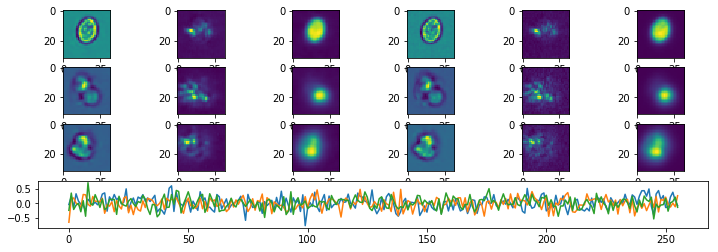

Iteration:  90100 Loss:  1.6604717 1.6604717 0.0
Test Loss 3.1388307
Iteration:  90200 Loss:  1.8889072 1.8889072 0.0
Test Loss 3.1395059
Iteration:  90300 Loss:  1.8378811 1.8378811 0.0
Test Loss 3.1299787
Iteration:  90400 Loss:  1.9060552 1.9060552 0.0
Test Loss 3.1086063
Iteration:  90500 Loss:  1.7990901 1.7990901 0.0
Test Loss 3.1162093
Iteration:  90600 Loss:  1.8435893 1.8435893 0.0
Test Loss 3.1172893
Iteration:  90700 Loss:  1.8661984 1.8661984 0.0
Test Loss 3.1157775
Iteration:  90800 Loss:  1.9216076 1.9216076 0.0
Test Loss 3.1051989
Iteration:  90900 Loss:  1.7372307 1.7372307 0.0
Test Loss 3.1030087
Iteration:  91000 Loss:  1.896978 1.896978 0.0
Test Loss 3.1195495
Iteration:  91000 Loss:  1.896978 1.896978 0.0
Test Loss 3.1195495


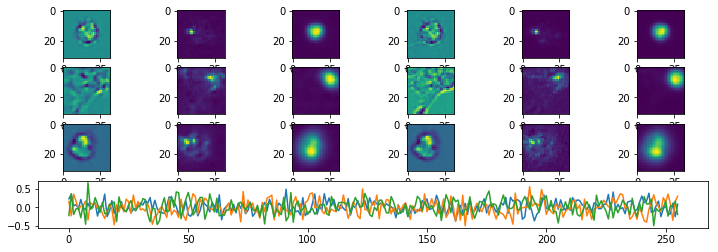

Iteration:  91100 Loss:  1.8723271 1.8723271 0.0
Test Loss 3.1039395
Iteration:  91200 Loss:  1.9211426 1.9211426 0.0
Test Loss 3.1149063
Iteration:  91300 Loss:  1.9448614 1.9448614 0.0
Test Loss 3.1040082
Iteration:  91400 Loss:  1.9117136 1.9117136 0.0
Test Loss 3.1207583
Iteration:  91500 Loss:  1.8351321 1.8351321 0.0
Test Loss 3.1215181
Iteration:  91600 Loss:  1.7604411 1.7604411 0.0
Test Loss 3.1071434
Iteration:  91700 Loss:  1.9862059 1.9862059 0.0
Test Loss 3.1174521
Iteration:  91800 Loss:  1.8941987 1.8941987 0.0
Test Loss 3.1058235
Iteration:  91900 Loss:  1.8483169 1.8483169 0.0
Test Loss 3.1176705
Iteration:  92000 Loss:  1.8771231 1.8771231 0.0
Test Loss 3.1319902
Iteration:  92000 Loss:  1.8771231 1.8771231 0.0
Test Loss 3.1319902


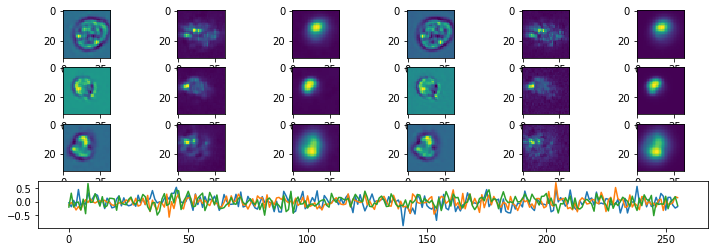

Iteration:  92100 Loss:  1.9864373 1.9864373 0.0
Test Loss 3.114717
Iteration:  92200 Loss:  1.7698929 1.7698929 0.0
Test Loss 3.1219773
Iteration:  92300 Loss:  1.8723209 1.8723209 0.0
Test Loss 3.132128
Iteration:  92400 Loss:  1.894382 1.894382 0.0
Test Loss 3.1223931
Iteration:  92500 Loss:  1.9563485 1.9563485 0.0
Test Loss 3.1209183
Iteration:  92600 Loss:  1.8675631 1.8675631 0.0
Test Loss 3.104457
Iteration:  92700 Loss:  1.7334518 1.7334518 0.0
Test Loss 3.1103895
Iteration:  92800 Loss:  1.7090333 1.7090333 0.0
Test Loss 3.1006963
Iteration:  92900 Loss:  1.903341 1.903341 0.0
Test Loss 3.1287885
Iteration:  93000 Loss:  1.7235148 1.7235148 0.0
Test Loss 3.108461
Iteration:  93000 Loss:  1.7235148 1.7235148 0.0
Test Loss 3.108461


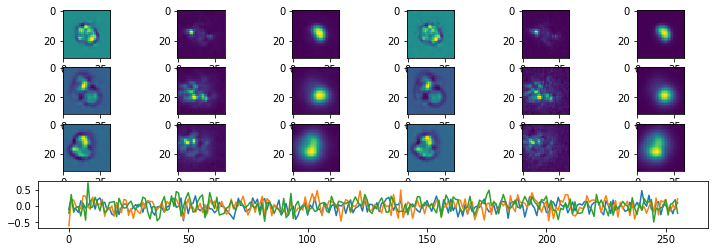

Iteration:  93100 Loss:  1.8635539 1.8635539 0.0
Test Loss 3.1190877
Iteration:  93200 Loss:  1.7631536 1.7631536 0.0
Test Loss 3.1090164
Iteration:  93300 Loss:  1.7844832 1.7844832 0.0
Test Loss 3.1382742
Iteration:  93400 Loss:  1.822445 1.822445 0.0
Test Loss 3.1238008
Iteration:  93500 Loss:  1.8383704 1.8383704 0.0
Test Loss 3.1088789
Iteration:  93600 Loss:  1.7749412 1.7749412 0.0
Test Loss 3.1159985
Iteration:  93700 Loss:  1.815519 1.815519 0.0
Test Loss 3.109221
Iteration:  93800 Loss:  1.7759249 1.7759249 0.0
Test Loss 3.1398454
Iteration:  93900 Loss:  1.7286136 1.7286136 0.0
Test Loss 3.1125226
Iteration:  94000 Loss:  1.8232111 1.8232111 0.0
Test Loss 3.1101608
Iteration:  94000 Loss:  1.8232111 1.8232111 0.0
Test Loss 3.1101608


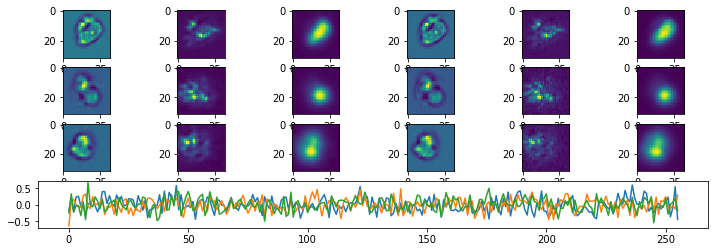

Iteration:  94100 Loss:  1.7923555 1.7923555 0.0
Test Loss 3.1128075
Iteration:  94200 Loss:  1.7337319 1.7337319 0.0
Test Loss 3.1315908
Iteration:  94300 Loss:  1.7558601 1.7558601 0.0
Test Loss 3.1161535
Iteration:  94400 Loss:  1.7444079 1.7444079 0.0
Test Loss 3.1163754
Iteration:  94500 Loss:  1.773675 1.773675 0.0
Test Loss 3.135355
Iteration:  94600 Loss:  1.8393992 1.8393992 0.0
Test Loss 3.132388
Iteration:  94700 Loss:  1.7565703 1.7565703 0.0
Test Loss 3.1265757
Iteration:  94800 Loss:  1.7802374 1.7802374 0.0
Test Loss 3.1209037
Iteration:  94900 Loss:  1.7446895 1.7446895 0.0
Test Loss 3.1243687
Iteration:  95000 Loss:  1.779165 1.779165 0.0
Test Loss 3.1292443
Iteration:  95000 Loss:  1.779165 1.779165 0.0
Test Loss 3.1292443


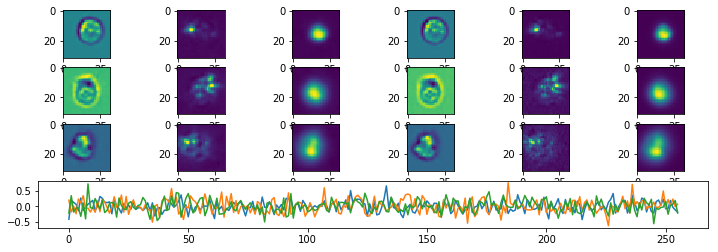

Iteration:  95100 Loss:  1.8594395 1.8594395 0.0
Test Loss 3.111826
Iteration:  95200 Loss:  1.896348 1.896348 0.0
Test Loss 3.1180773
Iteration:  95300 Loss:  1.8771803 1.8771803 0.0
Test Loss 3.120287
Iteration:  95400 Loss:  1.9363174 1.9363174 0.0
Test Loss 3.1045885
Iteration:  95500 Loss:  1.7787142 1.7787142 0.0
Test Loss 3.144573
Iteration:  95600 Loss:  1.9555022 1.9555022 0.0
Test Loss 3.1412413
Iteration:  95700 Loss:  1.7936751 1.7936751 0.0
Test Loss 3.1156414
Iteration:  95800 Loss:  1.9141381 1.9141381 0.0
Test Loss 3.1280518
Iteration:  95900 Loss:  1.679674 1.679674 0.0
Test Loss 3.1317616
Iteration:  96000 Loss:  1.7368423 1.7368423 0.0
Test Loss 3.107506
Iteration:  96000 Loss:  1.7368423 1.7368423 0.0
Test Loss 3.107506


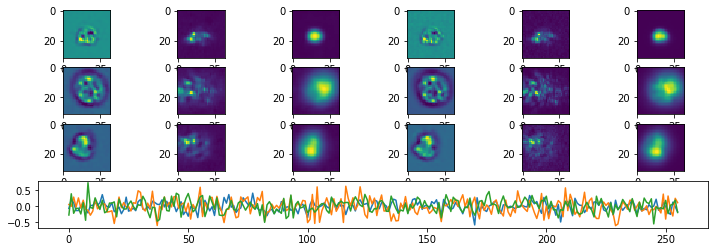

Iteration:  96100 Loss:  1.7912943 1.7912943 0.0
Test Loss 3.147246
Iteration:  96200 Loss:  1.7564687 1.7564687 0.0
Test Loss 3.126185
Iteration:  96300 Loss:  1.9306256 1.9306256 0.0
Test Loss 3.11055
Iteration:  96400 Loss:  1.9818735 1.9818735 0.0
Test Loss 3.1227336
Iteration:  96500 Loss:  1.9969549 1.9969549 0.0
Test Loss 3.131872
Iteration:  96600 Loss:  1.7591333 1.7591333 0.0
Test Loss 3.1220095
Iteration:  96700 Loss:  1.7778232 1.7778232 0.0
Test Loss 3.1276457
Iteration:  96800 Loss:  1.7594775 1.7594775 0.0
Test Loss 3.1146977
Iteration:  96900 Loss:  1.85976 1.85976 0.0
Test Loss 3.12499
Iteration:  97000 Loss:  1.769167 1.769167 0.0
Test Loss 3.1456654
Iteration:  97000 Loss:  1.769167 1.769167 0.0
Test Loss 3.1456654


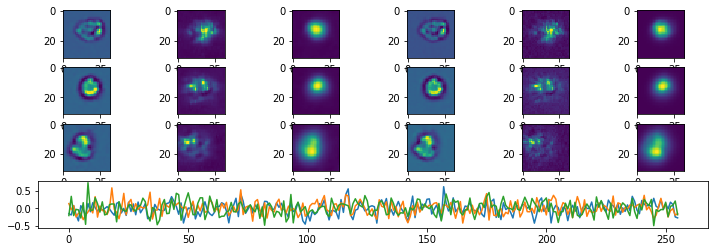

Iteration:  97100 Loss:  1.8949375 1.8949375 0.0
Test Loss 3.1240883
Iteration:  97200 Loss:  1.7309022 1.7309022 0.0
Test Loss 3.1539493
Iteration:  97300 Loss:  1.8385358 1.8385358 0.0
Test Loss 3.1248088
Iteration:  97400 Loss:  1.7159827 1.7159827 0.0
Test Loss 3.1126995
Iteration:  97500 Loss:  1.7829591 1.7829591 0.0
Test Loss 3.121489
Iteration:  97600 Loss:  1.8766664 1.8766664 0.0
Test Loss 3.1112404
Iteration:  97700 Loss:  1.840338 1.840338 0.0
Test Loss 3.1325638
Iteration:  97800 Loss:  1.8991466 1.8991466 0.0
Test Loss 3.135323
Iteration:  97900 Loss:  1.8169553 1.8169553 0.0
Test Loss 3.1473422
Iteration:  98000 Loss:  1.9237176 1.9237176 0.0
Test Loss 3.1104374
Iteration:  98000 Loss:  1.9237176 1.9237176 0.0
Test Loss 3.1104374


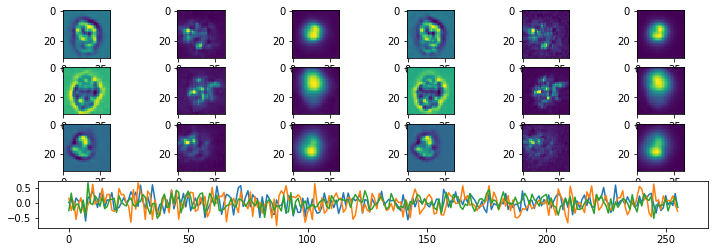

Iteration:  98100 Loss:  1.6204941 1.6204941 0.0
Test Loss 3.1328049
Iteration:  98200 Loss:  1.6286521 1.6286521 0.0
Test Loss 3.1266675
Iteration:  98300 Loss:  1.7143922 1.7143922 0.0
Test Loss 3.1183455
Iteration:  98400 Loss:  1.8943582 1.8943582 0.0
Test Loss 3.1114209
Iteration:  98500 Loss:  1.8908817 1.8908817 0.0
Test Loss 3.1227422
Iteration:  98600 Loss:  1.8519461 1.8519461 0.0
Test Loss 3.1315029
Iteration:  98700 Loss:  1.7677554 1.7677554 0.0
Test Loss 3.1320457
Iteration:  98800 Loss:  1.8987128 1.8987128 0.0
Test Loss 3.127497
Iteration:  98900 Loss:  1.7246553 1.7246553 0.0
Test Loss 3.1286144
Iteration:  99000 Loss:  1.7953706 1.7953706 0.0
Test Loss 3.1085398
Iteration:  99000 Loss:  1.7953706 1.7953706 0.0
Test Loss 3.1085398


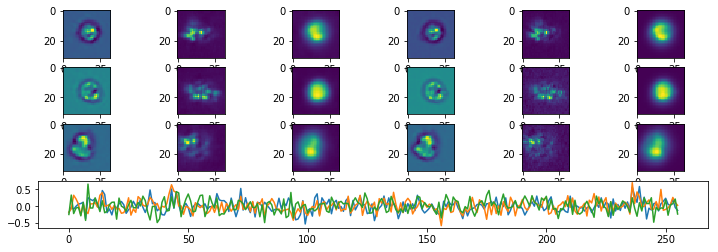

Iteration:  99100 Loss:  1.8760567 1.8760567 0.0
Test Loss 3.1062768
Iteration:  99200 Loss:  1.8456359 1.8456359 0.0
Test Loss 3.1244936
Iteration:  99300 Loss:  1.8061951 1.8061951 0.0
Test Loss 3.1590698
Iteration:  99400 Loss:  1.8703077 1.8703077 0.0
Test Loss 3.1224196
Iteration:  99500 Loss:  1.7678982 1.7678982 0.0
Test Loss 3.1303675
Iteration:  99600 Loss:  1.7449269 1.7449269 0.0
Test Loss 3.1343212
Iteration:  99700 Loss:  1.8104851 1.8104851 0.0
Test Loss 3.1443365
Iteration:  99800 Loss:  1.7720196 1.7720196 0.0
Test Loss 3.1209617
Iteration:  99900 Loss:  1.8450083 1.8450083 0.0
Test Loss 3.1112614
Iteration:  100000 Loss:  1.7423149 1.7423149 0.0
Test Loss 3.118249
Iteration:  100000 Loss:  1.7423149 1.7423149 0.0
Test Loss 3.118249


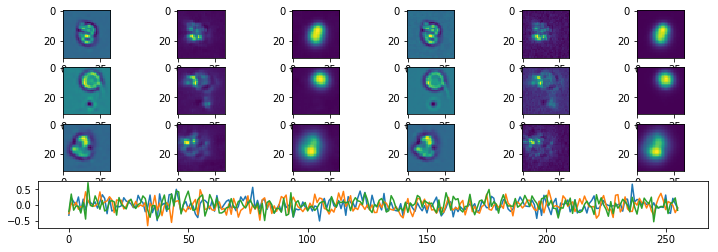

Iteration:  100100 Loss:  1.8229153 1.8229153 0.0
Test Loss 3.135383
Iteration:  100200 Loss:  1.8200915 1.8200915 0.0
Test Loss 3.146249
Iteration:  100300 Loss:  1.7747688 1.7747688 0.0
Test Loss 3.1393924
Iteration:  100400 Loss:  1.8059902 1.8059902 0.0
Test Loss 3.1349604
Iteration:  100500 Loss:  1.8941745 1.8941745 0.0
Test Loss 3.1144712
Iteration:  100600 Loss:  1.8315406 1.8315406 0.0
Test Loss 3.1246178
Iteration:  100700 Loss:  1.7880805 1.7880805 0.0
Test Loss 3.1236613
Iteration:  100800 Loss:  1.7037417 1.7037417 0.0
Test Loss 3.1803257
Iteration:  100900 Loss:  1.8431993 1.8431993 0.0
Test Loss 3.134376
Iteration:  101000 Loss:  1.8304883 1.8304883 0.0
Test Loss 3.1434724
Iteration:  101000 Loss:  1.8304883 1.8304883 0.0
Test Loss 3.1434724


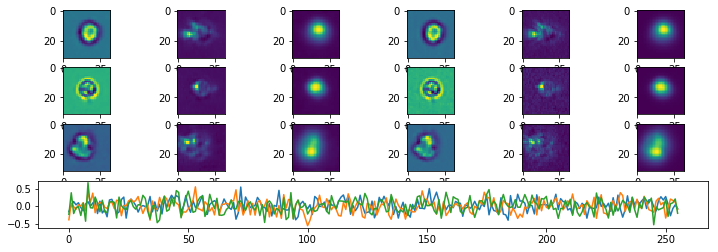

Iteration:  101100 Loss:  1.7335932 1.7335932 0.0
Test Loss 3.125498
Iteration:  101200 Loss:  1.6551107 1.6551107 0.0
Test Loss 3.1204724
Iteration:  101300 Loss:  1.838671 1.838671 0.0
Test Loss 3.1241546
Iteration:  101400 Loss:  1.7232125 1.7232125 0.0
Test Loss 3.1185222
Iteration:  101500 Loss:  1.9106436 1.9106436 0.0
Test Loss 3.1184483
Iteration:  101600 Loss:  1.9053377 1.9053377 0.0
Test Loss 3.116588
Iteration:  101700 Loss:  1.7761785 1.7761785 0.0
Test Loss 3.1268106
Iteration:  101800 Loss:  1.848686 1.848686 0.0
Test Loss 3.1217346
Iteration:  101900 Loss:  1.7557757 1.7557757 0.0
Test Loss 3.1098642
Iteration:  102000 Loss:  1.9375525 1.9375525 0.0
Test Loss 3.1529913
Iteration:  102000 Loss:  1.9375525 1.9375525 0.0
Test Loss 3.1529913


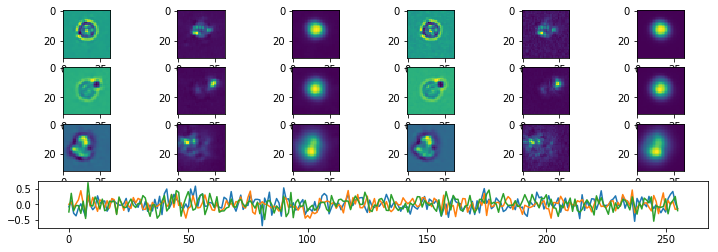

Iteration:  102100 Loss:  1.7592018 1.7592018 0.0
Test Loss 3.1159346
Iteration:  102200 Loss:  1.8837876 1.8837876 0.0
Test Loss 3.1166344
Iteration:  102300 Loss:  1.8079156 1.8079156 0.0
Test Loss 3.117322
Iteration:  102400 Loss:  1.5919756 1.5919756 0.0
Test Loss 3.1393862
Iteration:  102500 Loss:  1.9132836 1.9132836 0.0
Test Loss 3.1208217
Iteration:  102600 Loss:  1.9097383 1.9097383 0.0
Test Loss 3.120724
Iteration:  102700 Loss:  1.767928 1.767928 0.0
Test Loss 3.1217432
Iteration:  102800 Loss:  1.8747973 1.8747973 0.0
Test Loss 3.1237829
Iteration:  102900 Loss:  1.7997987 1.7997987 0.0
Test Loss 3.1208093
Iteration:  103000 Loss:  1.7954795 1.7954795 0.0
Test Loss 3.119197
Iteration:  103000 Loss:  1.7954795 1.7954795 0.0
Test Loss 3.119197


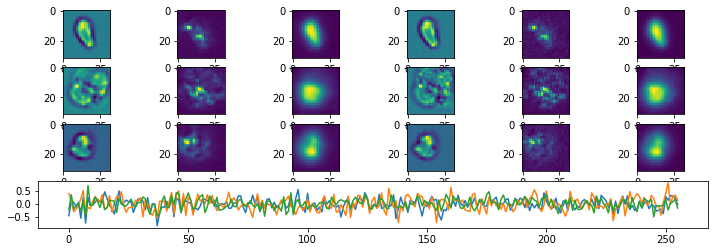

Iteration:  103100 Loss:  1.691603 1.691603 0.0
Test Loss 3.1158047
Iteration:  103200 Loss:  1.8211212 1.8211212 0.0
Test Loss 3.1173897
Iteration:  103300 Loss:  1.8090516 1.8090516 0.0
Test Loss 3.114964
Iteration:  103400 Loss:  1.774488 1.774488 0.0
Test Loss 3.1208582
Iteration:  103500 Loss:  1.8197832 1.8197832 0.0
Test Loss 3.1234117
Iteration:  103600 Loss:  1.6742553 1.6742553 0.0
Test Loss 3.129014
Iteration:  103700 Loss:  1.7123992 1.7123992 0.0
Test Loss 3.1287336
Iteration:  103800 Loss:  1.8180451 1.8180451 0.0
Test Loss 3.1179023
Iteration:  103900 Loss:  1.8342175 1.8342175 0.0
Test Loss 3.1221044
Iteration:  104000 Loss:  1.830456 1.830456 0.0
Test Loss 3.1227164
Iteration:  104000 Loss:  1.830456 1.830456 0.0
Test Loss 3.1227164


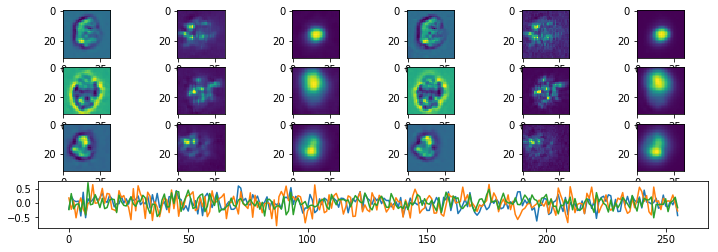

Iteration:  104100 Loss:  1.8266609 1.8266609 0.0
Test Loss 3.1282783
Iteration:  104200 Loss:  1.7662468 1.7662468 0.0
Test Loss 3.1276374
Iteration:  104300 Loss:  1.6869807 1.6869807 0.0
Test Loss 3.1226995
Iteration:  104400 Loss:  1.9746977 1.9746977 0.0
Test Loss 3.108493
Iteration:  104500 Loss:  1.8558176 1.8558176 0.0
Test Loss 3.1187544
Iteration:  104600 Loss:  1.7609689 1.7609689 0.0
Test Loss 3.113449
Iteration:  104700 Loss:  1.7640275 1.7640275 0.0
Test Loss 3.1135952
Iteration:  104800 Loss:  1.7443526 1.7443526 0.0
Test Loss 3.1369102
Iteration:  104900 Loss:  1.9156244 1.9156244 0.0
Test Loss 3.1333284
Iteration:  105000 Loss:  1.7148676 1.7148676 0.0
Test Loss 3.1318452
Iteration:  105000 Loss:  1.7148676 1.7148676 0.0
Test Loss 3.1318452


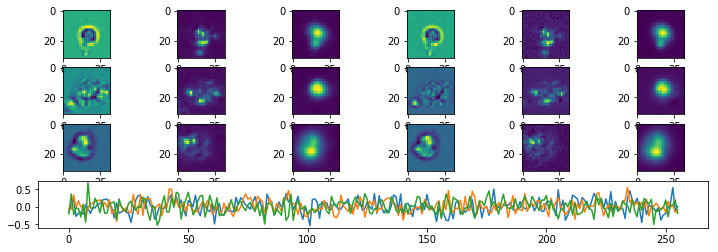

Iteration:  105100 Loss:  1.6964679 1.6964679 0.0
Test Loss 3.1229763
Iteration:  105200 Loss:  1.9497621 1.9497621 0.0
Test Loss 3.1153235
Iteration:  105300 Loss:  1.8401439 1.8401439 0.0
Test Loss 3.1240041
Iteration:  105400 Loss:  1.8680196 1.8680196 0.0
Test Loss 3.1452672
Iteration:  105500 Loss:  1.7178984 1.7178984 0.0
Test Loss 3.123604
Iteration:  105600 Loss:  1.6752806 1.6752806 0.0
Test Loss 3.139192
Iteration:  105700 Loss:  1.7345774 1.7345774 0.0
Test Loss 3.1196194
Iteration:  105800 Loss:  1.8892004 1.8892004 0.0
Test Loss 3.146966
Iteration:  105900 Loss:  1.8671222 1.8671222 0.0
Test Loss 3.1298742
Iteration:  106000 Loss:  1.9327958 1.9327958 0.0
Test Loss 3.1217475
Iteration:  106000 Loss:  1.9327958 1.9327958 0.0
Test Loss 3.1217475


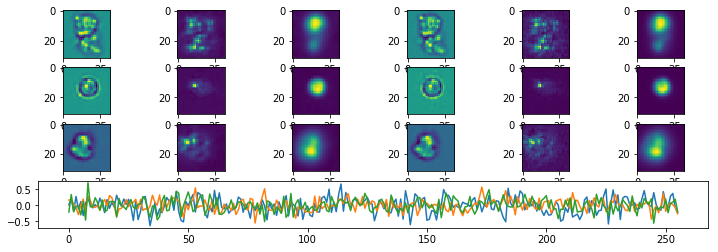

Iteration:  106100 Loss:  1.8481226 1.8481226 0.0
Test Loss 3.1352527
Iteration:  106200 Loss:  1.7195466 1.7195466 0.0
Test Loss 3.1312299
Iteration:  106300 Loss:  1.9084893 1.9084893 0.0
Test Loss 3.1209557
Iteration:  106400 Loss:  1.885854 1.885854 0.0
Test Loss 3.1506412
Iteration:  106500 Loss:  1.8217874 1.8217874 0.0
Test Loss 3.1250389
Iteration:  106600 Loss:  1.7303472 1.7303472 0.0
Test Loss 3.1268635
Iteration:  106700 Loss:  1.8966177 1.8966177 0.0
Test Loss 3.1381838
Iteration:  106800 Loss:  1.7339576 1.7339576 0.0
Test Loss 3.1342037
Iteration:  106900 Loss:  1.8750398 1.8750398 0.0
Test Loss 3.1179068
Iteration:  107000 Loss:  1.8249795 1.8249795 0.0
Test Loss 3.1289942
Iteration:  107000 Loss:  1.8249795 1.8249795 0.0
Test Loss 3.1289942


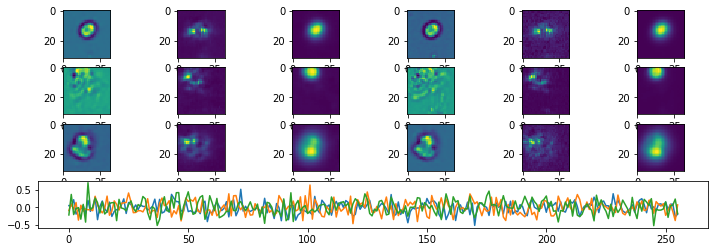

Iteration:  107100 Loss:  1.9118835 1.9118835 0.0
Test Loss 3.126838
Iteration:  107200 Loss:  1.7790364 1.7790364 0.0
Test Loss 3.1434112
Iteration:  107300 Loss:  1.7573841 1.7573841 0.0
Test Loss 3.1313953
Iteration:  107400 Loss:  1.670603 1.670603 0.0
Test Loss 3.1214044
Iteration:  107500 Loss:  1.7680439 1.7680439 0.0
Test Loss 3.119355
Iteration:  107600 Loss:  1.6964998 1.6964998 0.0
Test Loss 3.145674
Iteration:  107700 Loss:  1.81446 1.81446 0.0
Test Loss 3.145937
Iteration:  107800 Loss:  1.7484479 1.7484479 0.0
Test Loss 3.120564
Iteration:  107900 Loss:  1.8971682 1.8971682 0.0
Test Loss 3.1383371
Iteration:  108000 Loss:  1.7967014 1.7967014 0.0
Test Loss 3.1177478
Iteration:  108000 Loss:  1.7967014 1.7967014 0.0
Test Loss 3.1177478


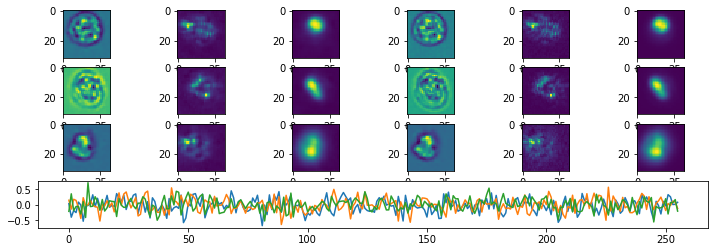

Iteration:  108100 Loss:  1.7735012 1.7735012 0.0
Test Loss 3.1115665
Iteration:  108200 Loss:  1.7964827 1.7964827 0.0
Test Loss 3.1377795
Iteration:  108300 Loss:  1.7730553 1.7730553 0.0
Test Loss 3.1097467
Iteration:  108400 Loss:  1.7988331 1.7988331 0.0
Test Loss 3.1211271
Iteration:  108500 Loss:  1.8491595 1.8491595 0.0
Test Loss 3.1368823
Iteration:  108600 Loss:  1.8042681 1.8042681 0.0
Test Loss 3.1327143
Iteration:  108700 Loss:  1.7481979 1.7481979 0.0
Test Loss 3.1324325
Iteration:  108800 Loss:  1.7912264 1.7912264 0.0
Test Loss 3.125358
Iteration:  108900 Loss:  1.9079648 1.9079648 0.0
Test Loss 3.1284003
Iteration:  109000 Loss:  1.7291002 1.7291002 0.0
Test Loss 3.119421
Iteration:  109000 Loss:  1.7291002 1.7291002 0.0
Test Loss 3.119421


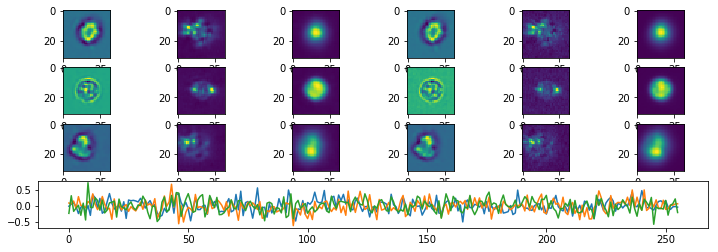

Iteration:  109100 Loss:  1.6501255 1.6501255 0.0
Test Loss 3.1275876
Iteration:  109200 Loss:  1.6898351 1.6898351 0.0
Test Loss 3.1261508
Iteration:  109300 Loss:  1.7681503 1.7681503 0.0
Test Loss 3.1193125
Iteration:  109400 Loss:  1.7908545 1.7908545 0.0
Test Loss 3.1325772
Iteration:  109500 Loss:  1.7692201 1.7692201 0.0
Test Loss 3.1168752
Iteration:  109600 Loss:  1.6343395 1.6343395 0.0
Test Loss 3.1295815
Iteration:  109700 Loss:  1.780355 1.780355 0.0
Test Loss 3.1237726
Iteration:  109800 Loss:  1.6393483 1.6393483 0.0
Test Loss 3.1138275
Iteration:  109900 Loss:  1.7838423 1.7838423 0.0
Test Loss 3.126163
Iteration:  110000 Loss:  1.9086766 1.9086766 0.0
Test Loss 3.1419559
Iteration:  110000 Loss:  1.9086766 1.9086766 0.0
Test Loss 3.1419559


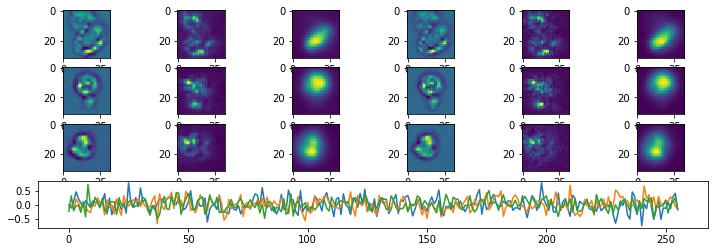

Iteration:  110100 Loss:  1.6875026 1.6875026 0.0
Test Loss 3.124214
Iteration:  110200 Loss:  1.8879037 1.8879037 0.0
Test Loss 3.138723
Iteration:  110300 Loss:  1.7186091 1.7186091 0.0
Test Loss 3.1488552
Iteration:  110400 Loss:  1.8814046 1.8814046 0.0
Test Loss 3.1469517
Iteration:  110500 Loss:  1.7877107 1.7877107 0.0
Test Loss 3.1283057
Iteration:  110600 Loss:  1.7644151 1.7644151 0.0
Test Loss 3.1279488
Iteration:  110700 Loss:  1.7077768 1.7077768 0.0
Test Loss 3.146177
Iteration:  110800 Loss:  1.837534 1.837534 0.0
Test Loss 3.1558437
Iteration:  110900 Loss:  1.7973676 1.7973676 0.0
Test Loss 3.1294534
Iteration:  111000 Loss:  1.7741437 1.7741437 0.0
Test Loss 3.124758
Iteration:  111000 Loss:  1.7741437 1.7741437 0.0
Test Loss 3.124758


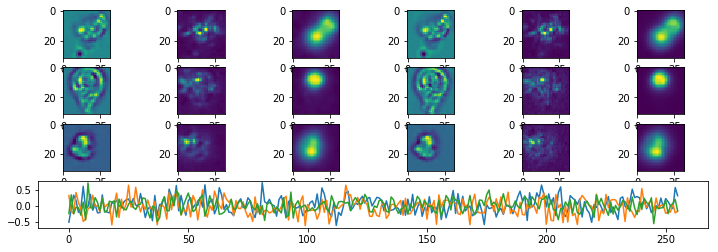

Iteration:  111100 Loss:  1.7839575 1.7839575 0.0
Test Loss 3.1366158
Iteration:  111200 Loss:  1.7204593 1.7204593 0.0
Test Loss 3.1329608
Iteration:  111300 Loss:  1.8186678 1.8186678 0.0
Test Loss 3.1305926
Iteration:  111400 Loss:  1.7787749 1.7787749 0.0
Test Loss 3.1158571
Iteration:  111500 Loss:  1.8555696 1.8555696 0.0
Test Loss 3.1312246
Iteration:  111600 Loss:  1.7542655 1.7542655 0.0
Test Loss 3.1146188
Iteration:  111700 Loss:  1.7646909 1.7646909 0.0
Test Loss 3.135666
Iteration:  111800 Loss:  1.7231243 1.7231243 0.0
Test Loss 3.1418867
Iteration:  111900 Loss:  1.6510849 1.6510849 0.0
Test Loss 3.1296763
Iteration:  112000 Loss:  1.59654 1.59654 0.0
Test Loss 3.1354012
Iteration:  112000 Loss:  1.59654 1.59654 0.0
Test Loss 3.1354012


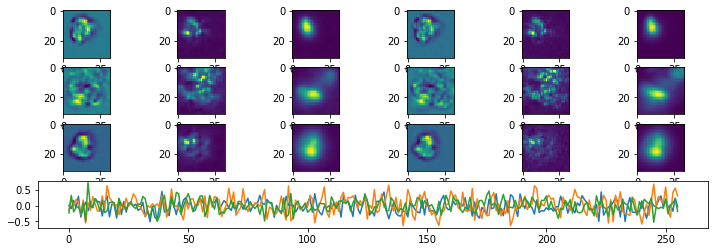

Iteration:  112100 Loss:  1.8103529 1.8103529 0.0
Test Loss 3.1358185
Iteration:  112200 Loss:  1.8041177 1.8041177 0.0
Test Loss 3.1405563
Iteration:  112300 Loss:  1.8521876 1.8521876 0.0
Test Loss 3.1415787
Iteration:  112400 Loss:  1.7762549 1.7762549 0.0
Test Loss 3.135572
Iteration:  112500 Loss:  1.804418 1.804418 0.0
Test Loss 3.1360226
Iteration:  112600 Loss:  1.8601409 1.8601409 0.0
Test Loss 3.1278837
Iteration:  112700 Loss:  1.7178869 1.7178869 0.0
Test Loss 3.1349196
Iteration:  112800 Loss:  1.8424821 1.8424821 0.0
Test Loss 3.1496701
Iteration:  112900 Loss:  1.6924697 1.6924697 0.0
Test Loss 3.130942
Iteration:  113000 Loss:  1.9921986 1.9921986 0.0
Test Loss 3.1345189
Iteration:  113000 Loss:  1.9921986 1.9921986 0.0
Test Loss 3.1345189


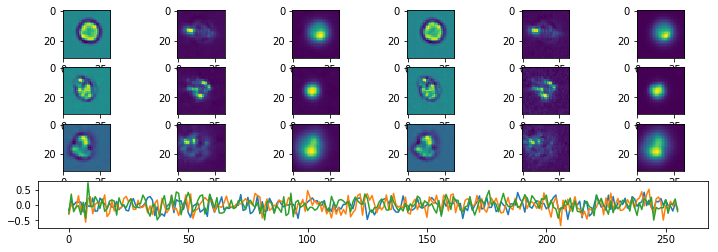

Iteration:  113100 Loss:  1.8023652 1.8023652 0.0
Test Loss 3.137073
Iteration:  113200 Loss:  1.740722 1.740722 0.0
Test Loss 3.1383944
Iteration:  113300 Loss:  1.8171418 1.8171418 0.0
Test Loss 3.1426177
Iteration:  113400 Loss:  1.7815363 1.7815363 0.0
Test Loss 3.1313453
Iteration:  113500 Loss:  1.945441 1.945441 0.0
Test Loss 3.1503088
Iteration:  113600 Loss:  1.8027776 1.8027776 0.0
Test Loss 3.1225486
Iteration:  113700 Loss:  1.9559028 1.9559028 0.0
Test Loss 3.1373038
Iteration:  113800 Loss:  1.895148 1.895148 0.0
Test Loss 3.1410918
Iteration:  113900 Loss:  1.7515792 1.7515792 0.0
Test Loss 3.1259143
Iteration:  114000 Loss:  1.8034501 1.8034501 0.0
Test Loss 3.1373212
Iteration:  114000 Loss:  1.8034501 1.8034501 0.0
Test Loss 3.1373212


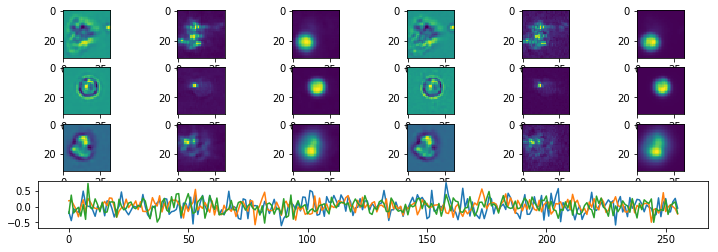

Iteration:  114100 Loss:  1.8294884 1.8294884 0.0
Test Loss 3.137414
Iteration:  114200 Loss:  1.6282158 1.6282158 0.0
Test Loss 3.1276147
Iteration:  114300 Loss:  1.8088021 1.8088021 0.0
Test Loss 3.134474
Iteration:  114400 Loss:  1.6530375 1.6530375 0.0
Test Loss 3.1344295
Iteration:  114500 Loss:  1.7875166 1.7875166 0.0
Test Loss 3.1390276
Iteration:  114600 Loss:  1.8326974 1.8326974 0.0
Test Loss 3.1520004
Iteration:  114700 Loss:  1.8179059 1.8179059 0.0
Test Loss 3.1253653
Iteration:  114800 Loss:  1.630069 1.630069 0.0
Test Loss 3.12132
Iteration:  114900 Loss:  1.8542508 1.8542508 0.0
Test Loss 3.13373
Iteration:  115000 Loss:  1.7995487 1.7995487 0.0
Test Loss 3.1317916
Iteration:  115000 Loss:  1.7995487 1.7995487 0.0
Test Loss 3.1317916


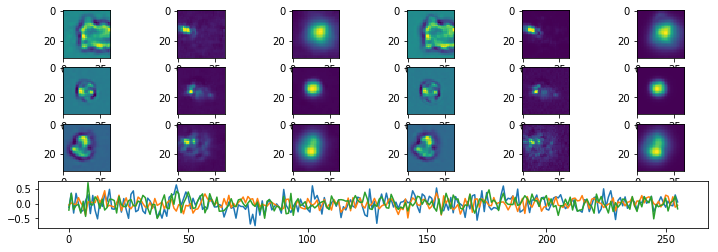

Iteration:  115100 Loss:  1.7642012 1.7642012 0.0
Test Loss 3.1385653
Iteration:  115200 Loss:  1.8112124 1.8112124 0.0
Test Loss 3.119708
Iteration:  115300 Loss:  1.824618 1.824618 0.0
Test Loss 3.125214
Iteration:  115400 Loss:  1.7918618 1.7918618 0.0
Test Loss 3.1256146
Iteration:  115500 Loss:  1.7817528 1.7817528 0.0
Test Loss 3.1512508
Iteration:  115600 Loss:  1.7833745 1.7833745 0.0
Test Loss 3.130406
Iteration:  115700 Loss:  1.8535944 1.8535944 0.0
Test Loss 3.149242
Iteration:  115800 Loss:  1.9461544 1.9461544 0.0
Test Loss 3.132445
Iteration:  115900 Loss:  1.7833818 1.7833818 0.0
Test Loss 3.127948
Iteration:  116000 Loss:  1.9064604 1.9064604 0.0
Test Loss 3.127148
Iteration:  116000 Loss:  1.9064604 1.9064604 0.0
Test Loss 3.127148


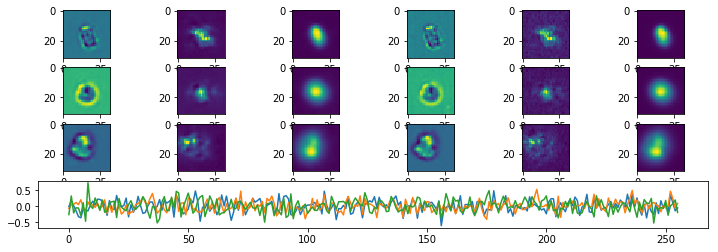

Iteration:  116100 Loss:  1.7603691 1.7603691 0.0
Test Loss 3.1397135
Iteration:  116200 Loss:  1.8023536 1.8023536 0.0
Test Loss 3.1314344
Iteration:  116300 Loss:  1.7754807 1.7754807 0.0
Test Loss 3.142368
Iteration:  116400 Loss:  1.7456031 1.7456031 0.0
Test Loss 3.1353528
Iteration:  116500 Loss:  1.6681095 1.6681095 0.0
Test Loss 3.1411617
Iteration:  116600 Loss:  1.7523949 1.7523949 0.0
Test Loss 3.1284187
Iteration:  116700 Loss:  1.893726 1.893726 0.0
Test Loss 3.1246743
Iteration:  116800 Loss:  1.7806251 1.7806251 0.0
Test Loss 3.1366043
Iteration:  116900 Loss:  1.8018826 1.8018826 0.0
Test Loss 3.1447194
Iteration:  117000 Loss:  1.8040391 1.8040391 0.0
Test Loss 3.140222
Iteration:  117000 Loss:  1.8040391 1.8040391 0.0
Test Loss 3.140222


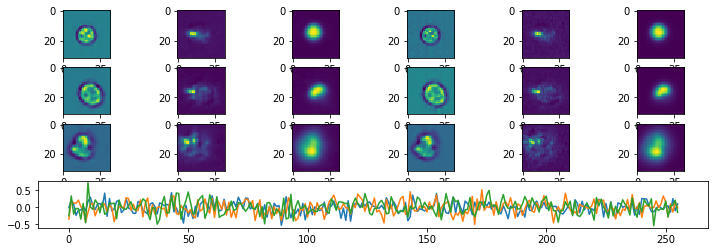

Iteration:  117100 Loss:  1.7432845 1.7432845 0.0
Test Loss 3.1331844
Iteration:  117200 Loss:  1.8573098 1.8573098 0.0
Test Loss 3.1366596
Iteration:  117300 Loss:  1.6754551 1.6754551 0.0
Test Loss 3.1345775
Iteration:  117400 Loss:  1.5827105 1.5827105 0.0
Test Loss 3.1343524
Iteration:  117500 Loss:  1.7982322 1.7982322 0.0
Test Loss 3.1360784
Iteration:  117600 Loss:  1.7402182 1.7402182 0.0
Test Loss 3.1279163
Iteration:  117700 Loss:  1.8132331 1.8132331 0.0
Test Loss 3.137448
Iteration:  117800 Loss:  1.7895514 1.7895514 0.0
Test Loss 3.1374319
Iteration:  117900 Loss:  1.7284477 1.7284477 0.0
Test Loss 3.1251538
Iteration:  118000 Loss:  2.0090604 2.0090604 0.0
Test Loss 3.134347
Iteration:  118000 Loss:  2.0090604 2.0090604 0.0
Test Loss 3.134347


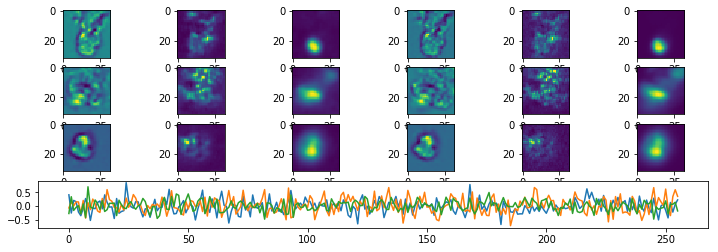

Iteration:  118100 Loss:  1.8696575 1.8696575 0.0
Test Loss 3.1445336
Iteration:  118200 Loss:  1.8345356 1.8345356 0.0
Test Loss 3.190009
Iteration:  118300 Loss:  1.7546151 1.7546151 0.0
Test Loss 3.1415374
Iteration:  118400 Loss:  1.7648587 1.7648587 0.0
Test Loss 3.1407068
Iteration:  118500 Loss:  1.7103988 1.7103988 0.0
Test Loss 3.1247065
Iteration:  118600 Loss:  1.6995203 1.6995203 0.0
Test Loss 3.1377957
Iteration:  118700 Loss:  1.8183987 1.8183987 0.0
Test Loss 3.1218438
Iteration:  118800 Loss:  1.7751458 1.7751458 0.0
Test Loss 3.1399477
Iteration:  118900 Loss:  1.6917714 1.6917714 0.0
Test Loss 3.1154718
Iteration:  119000 Loss:  1.757976 1.757976 0.0
Test Loss 3.129719
Iteration:  119000 Loss:  1.757976 1.757976 0.0
Test Loss 3.129719


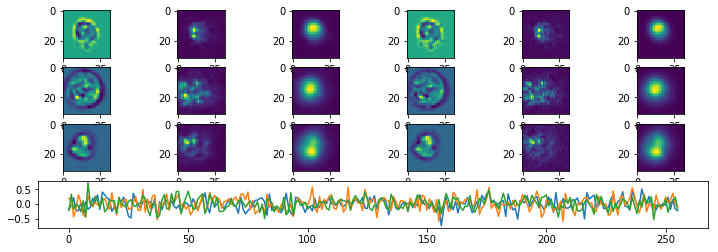

Iteration:  119100 Loss:  1.8201102 1.8201102 0.0
Test Loss 3.1352434
Iteration:  119200 Loss:  1.7993172 1.7993172 0.0
Test Loss 3.128674
Iteration:  119300 Loss:  1.9097505 1.9097505 0.0
Test Loss 3.1465635
Iteration:  119400 Loss:  1.8845638 1.8845638 0.0
Test Loss 3.1516004
Iteration:  119500 Loss:  1.878633 1.878633 0.0
Test Loss 3.1400712
Iteration:  119600 Loss:  1.6869816 1.6869816 0.0
Test Loss 3.1569972
Iteration:  119700 Loss:  1.7397844 1.7397844 0.0
Test Loss 3.1455207
Iteration:  119800 Loss:  1.7607691 1.7607691 0.0
Test Loss 3.1351087
Iteration:  119900 Loss:  1.6945374 1.6945374 0.0
Test Loss 3.1299741
Iteration:  120000 Loss:  1.9212842 1.9212842 0.0
Test Loss 3.126603
Iteration:  120000 Loss:  1.9212842 1.9212842 0.0
Test Loss 3.126603


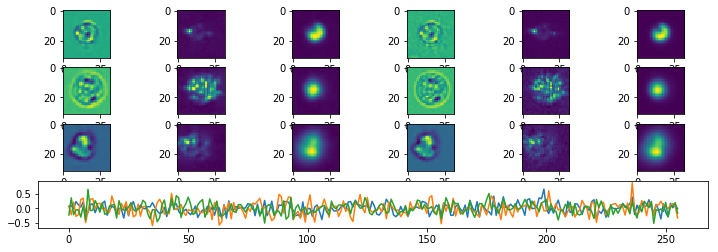

KeyboardInterrupt: 

In [4]:

p_mmdict = mmdict #{"Fish6_15_cjw_64.tif.mm": m3}
#             "plate04_all.mm": m4}

p_width = 32
p_height = 32
p_nchannels = 3
p_channels = [0,2, 4]
p_nepochs = 80
p_batchsize = 128
p_learning_rate = 0.0001  #.00005
p_restore = False
p_latent_size = 256 #128 + 64
p_droprate = 0.95
p_stdev = .04
p_slam = .000
p_denoise = None
enc_sizes = [(128, 3), (256, 3), (512, 3)]  #128, 3)]
######enc_sizes = [(64, 3), (128, 3), (256,3), (512,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
#enc_sizes = [(16, 5), (32, 3), (64,3), (128,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
dec_sizes = list(reversed(enc_sizes))
#dec_sizes.append((p_nchannels,7))

params = dict()

params['width'] = p_width
params['height'] = p_height
params['nchannels'] = p_nchannels
params['channels'] = p_channels
params['nepochs'] = p_nepochs
params['batchsize'] = p_batchsize
params['learning_rate'] = p_learning_rate
params['restore'] = p_restore
params['latent_size'] = p_latent_size
params['droprate'] = p_droprate
params['stdev'] = p_stdev
params['slam'] = p_slam
params['enc_sizes'] = enc_sizes
params['dec_sizes'] = dec_sizes
params['denoise'] = p_denoise
cpdir = "/media/cjw/Data/cyto/Checkpoints/2018-11-30-Snail_rop_slam0_m0"

if not os.path.exists(cpdir):
    os.makedirs(cpdir)
autoencoder_train.train(p_mmdict, p_df, params, 1000, cpdir, tloss=2)

In [ ]:
x = 4
x